# Análisis de señal EEG, detección del potencial evocado P300 y ataque basado en ruido
## Ingeniería Informática en la Universidad de Murcia - Trabajo Fin de Grado
### Desarrollado por Enrique Tomás Martínez Beltrán

https://github.com/enriquetomasmb/bci-tfg

## Importamos los paquetes necesarios

In [1]:
import sys
import os
import warnings
# sys.path.insert(0, os.path.join(sys.path[0], "utils"))
import mne
from mne import Epochs, find_events, pick_events
from collections import OrderedDict
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from datetime import datetime
import numpy as np
from scipy import signal

from analysis_tools import load_raw, convert_openbci, convert_new_openbci, apply_nontarget



In [2]:
sampling_rate = 250

#dataset = "data/input/last_exp.csv"
dataset = "data/record_28-07-2020-17-59-23.csv"
convert_raw_openbci_to_csv = False

subject = 0
session = 0
ch_names = {}

#### Se carga el fichero directamente si se emplea el script automático del repositorio
También se puede convertir una señal EEG, no capturada por el sistema implementado, para ser analizada igualmente. Más información en analysis_tools.py o en el repositorio: https://github.com/enriquetomasmb/bci-tfg

In [3]:
if convert_raw_openbci_to_csv:
    dataset = convert_new_openbci(dataset)
else:
    print("El fichero es obtenido del sistema automático descrito en el TFG e incluido en el repositorio de GitHub: https://github.com/enriquetomasmb/bci-tfg")

El fichero es obtenido del sistema automático descrito en el TFG e incluido en el repositorio de GitHub: https://github.com/enriquetomasmb/bci-tfg


## Cargamos el daset y formamos el Raw data

#### Representación del csv (obtenida mediante el lanzador de experimento del repositorio)
- Time
- Timestamp
- Canales (8 canales): Fp1, Fp2, C3, C4, P7, P8, O1, O2
- Estimulo Stream

In [4]:
# El siguiente comando para la representación:
# No contamos indice de ch la columna de "timestamps"
raw = load_raw(dataset, sfreq=sampling_rate, stim_ind=8, replace_ch_names=None, ch_ind=[0, 1, 2, 3, 4, 5, 6, 7])
#raw = load_raw(dataset, sfreq=sampling_rate, stim_ind=5, replace_ch_names=None, ch_ind=[0, 1, 2, 3]) # data.csv

print(raw)

Creating RawArray with float64 data, n_channels=9, n_times=45265
    Range : 0 ... 45264 =      0.000 ...   181.056 secs
Ready.
<RawArray | 9 x 45265 (181.1 s), ~3.1 MB, data loaded>


## Información del Raw

In [5]:
print('Frecuencia de muestreo:', raw.info['sfreq'], 'Hz')
print('Tamaño de la matriz de datos: {}\n'.format(raw.get_data().shape))

print(raw.info)

Frecuencia de muestreo: 250.0 Hz
Tamaño de la matriz de datos: (9, 45265)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, C3, C4, P7, P8, O1, O2, Stim
 chs: 8 EEG, 1 STIM
 custom_ref_applied: False
 dig: 11 items (3 Cardinal, 8 EEG)
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 9
 projs: []
 sfreq: 250.0 Hz
>


## Posible aplicación de filtrado solo por los canales O1 y O2
## También se considera el canal de estímulos STIM

In [6]:
# raw = raw.pick_channels(['O1', 'O2', 'Stim'])

## Se guardan los nombres de canales

In [7]:
for i, chn in enumerate(raw.ch_names):
    ch_names[chn] = i

print(ch_names)

{'Fp1': 0, 'Fp2': 1, 'C3': 2, 'C4': 3, 'P7': 4, 'P8': 5, 'O1': 6, 'O2': 7, 'Stim': 8}


## Representación de la densidad espectral de potencia a través de los canales en los datos sin procesar

Se puede ver que el canal FP2, uno de los canales localizados en la zona frontal de la cabeza.
¿movimientos frontales al parpadear?

Effective window size : 8.192 (s)


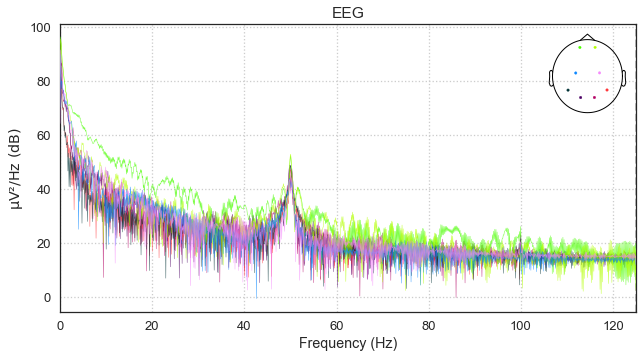

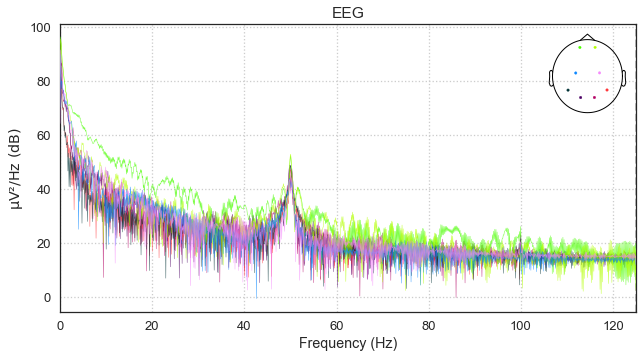

In [8]:
fig, ax = plt.subplots(figsize=(10, 5))
raw.plot_psd(ax=ax)
#raw.plot_psd(fmin=1, fmax=30)
#raw.plot(duration=5, n_channels=8)

## Representación gráfica de los canales en los primeros 10 segundos de captura

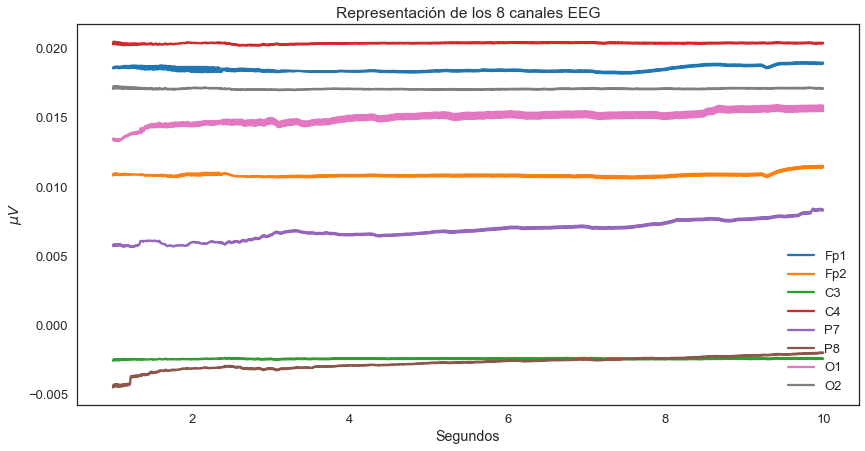

In [9]:
sfreq = raw.info['sfreq']
data_ini, times_ini = raw[:-1, int(sfreq * 1):int(sfreq * 10)]

fig = plt.subplots(figsize=(14, 7))
plt.plot(times_ini, data_ini.T);
plt.xlabel('Segundos')
plt.ylabel('$\mu V$')
plt.title('Representación de los 8 canales EEG');
plt.legend(raw.ch_names[:-1]);

## Downsampling de la señal
#### (Realizada posteriormente)

In [10]:
# print('Sampling Rate old:', raw.info['sfreq'], 'Hz')


# # Plot a piece of data to see the effects of downsampling
# plt.figure(figsize=(20, 3))

# n_samples_to_plot = int(0.5 * raw.info['sfreq'])  # plot 0.5 seconds of data
# data, times = raw[1, :n_samples_to_plot]
# plt.plot(times,data.T, color='black')


# # Downsampling
# raw.resample(125, npad="auto")
# print('Sampling Rate new:', raw.info['sfreq'], 'Hz')

# n_samples_to_plot = int(0.5 * raw.info['sfreq'])  # plot 0.5 seconds of data
# data, times = raw[1, :n_samples_to_plot]
# plt.plot(times,data.T,'-o', color='red')

# plt.xlabel('time (s)')
# plt.legend(['original', 'downsampled'], loc='best')
# plt.title('Efecto de downsampling en el canal O2 (2)')


In [11]:
# data, times = raw[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw.ch_names[:channels_to_plot]);

# Notch filter

#### Eliminar el ruido de la línea eléctrica con un filtro de muesca

Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1651 samples (6.604 sec)

Representación de la densidad espectral de potencia a través de los canales en los datos sin procesar
Effective window size : 8.192 (s)


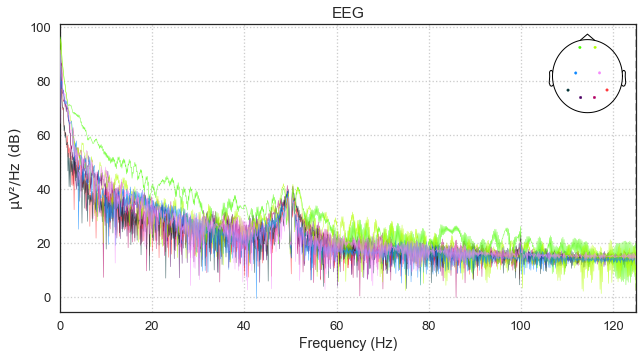

Effective window size : 8.192 (s)
Effective window size : 8.192 (s)


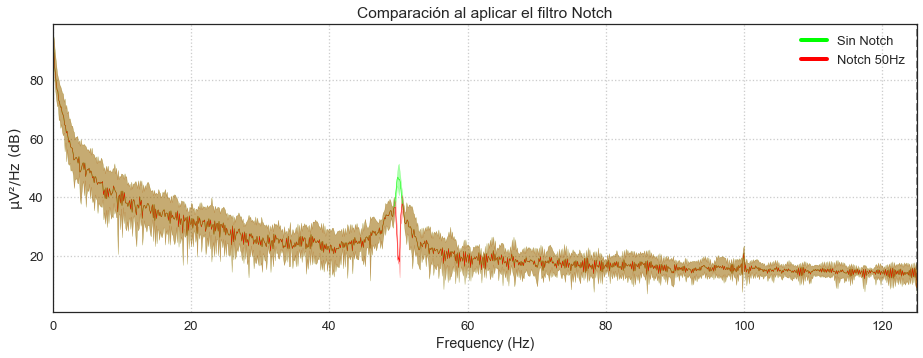

In [12]:
fig, ax = plt.subplots(figsize=(10, 5))

# Utilizo [50,100] en vez de np.arange(50, 100, 50) --> el primero incluye los casos necesarios y el arange solo el "50"
raw_notch = raw.copy().notch_filter([50.0])

print("Representación de la densidad espectral de potencia a través de los canales en los datos sin procesar")
raw_notch.plot_psd(ax=ax)
 
    
custom_lines = [Line2D([0], [0], color=(0, 1, 0), lw=4),
                Line2D([0], [0], color=(1, 0, 0), lw=4)]

fig, ax = plt.subplots(figsize = (15, 5))
raw.plot_psd(ax=ax, color=(0, 1, 0), average=True, show=False)
raw_notch.plot_psd(ax=ax, color=(1, 0, 0), average=True, show=False)
ax.set_title('Comparación al aplicar el filtro Notch')
plt.legend(custom_lines, ['Sin Notch', 'Notch 50Hz'])


## Otro orden, no hay gran diferencia --> uso justo el de arriba, además con IIR hay que hacerlo individualmente por cada frecuencia que consideramos.
# iir_params = dict(order=2, ftype='butter')
# raw_notch_2 = raw.copy().notch_filter([50], method='iir', iir_params=iir_params, filter_length='auto',phase='zero')
# raw_notch_2 = raw_notch_2.notch_filter([100], method='iir', iir_params=iir_params, filter_length='auto',phase='zero')


# fig, ax = plt.subplots(figsize = (40, 10))
# raw.plot_psd(ax=ax, color=(0, 1, 0), average=True, show=False)
# raw_notch_2.plot_psd(ax=ax, color=(1, 0, 0), average=True, show=False)
# ax.set_title('Comparación al aplicar el filtro Notch')
# plt.legend(custom_lines, ['Sin Notch', 'Notch 50Hz'])


# Aplico bandpass más adelante
# raw2 = raw_notch.filter(1., None, fir_design='firwin')
# raw2.plot_psd()


## Se aplica filtrado bandpass

https://www.researchgate.net/post/What_type_of_filter_is_best_suitable_for_filtering_EEG_data

FIR FILTER
- raw_filter = raw.copy().filter(.2, 20., fir_design='firwin', skip_by_annotation='edge')
- raw_filter = raw.copy().filter(.8, 20., fir_design='firwin', skip_by_annotation='edge')

IIR FILTER
- raw_filter = raw.copy().filter(0.01, 20., method='iir')


## Diferentes filtros pasobanda
### Con [1Hz, 17Hz] se ve francamante bien el P300
- https://hal.inria.fr/hal-00756669/document
- https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.filter (para ver cuál es lower y upper en IIR)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 10 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 10.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 15 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 15.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 17 Hz

IIR filter parameters
---------------------
Butterworth lowpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 8 (effective, after forward-backward)
- Cutoff at 17.00 Hz: -6.02 dB

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 10 Hz

IIR filter parameters
-------------------

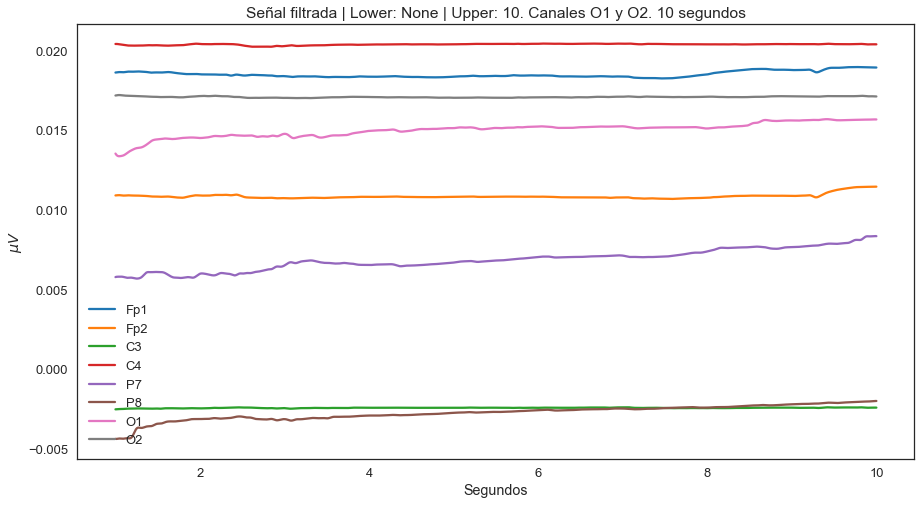

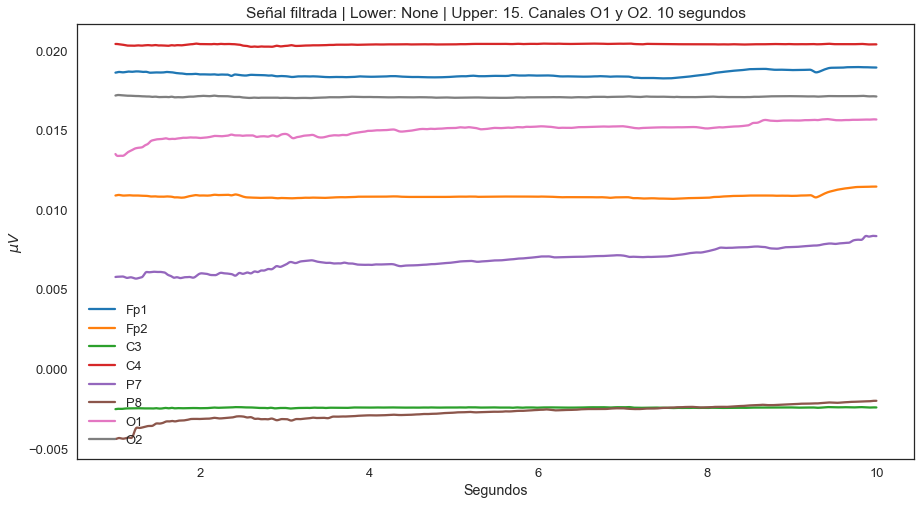

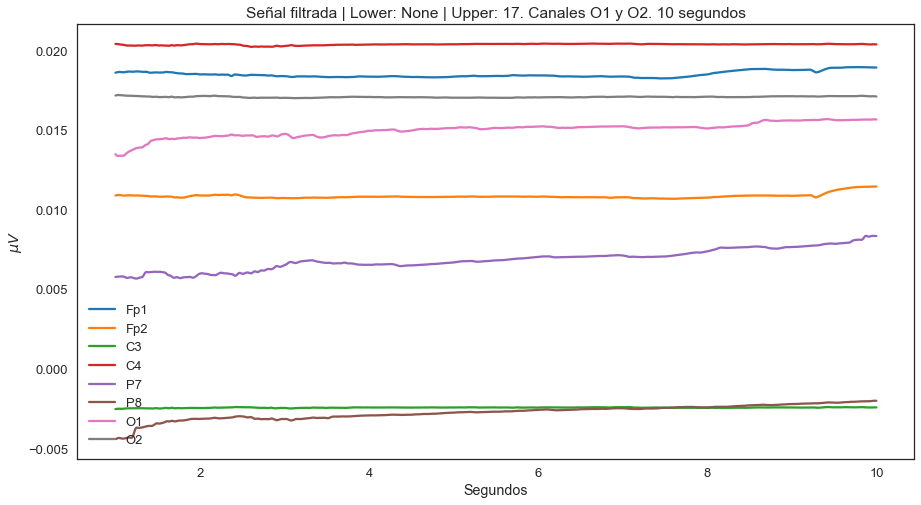

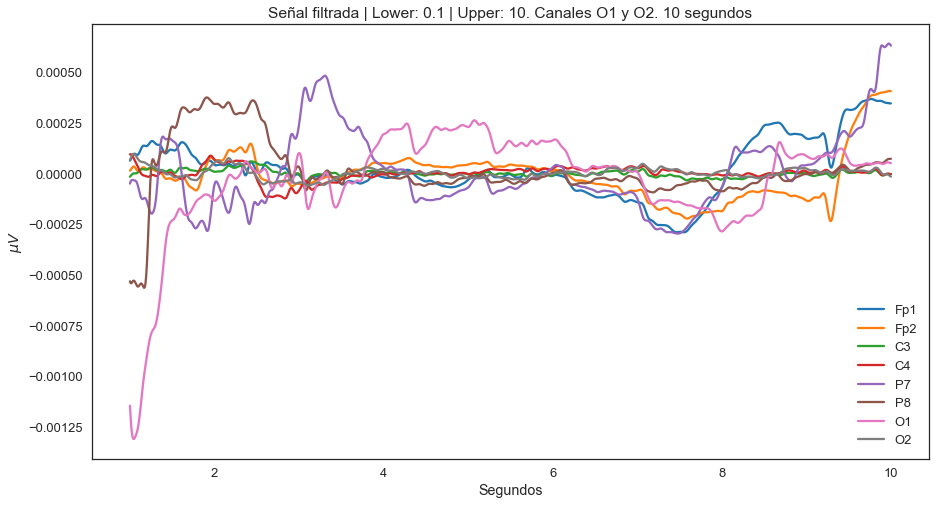

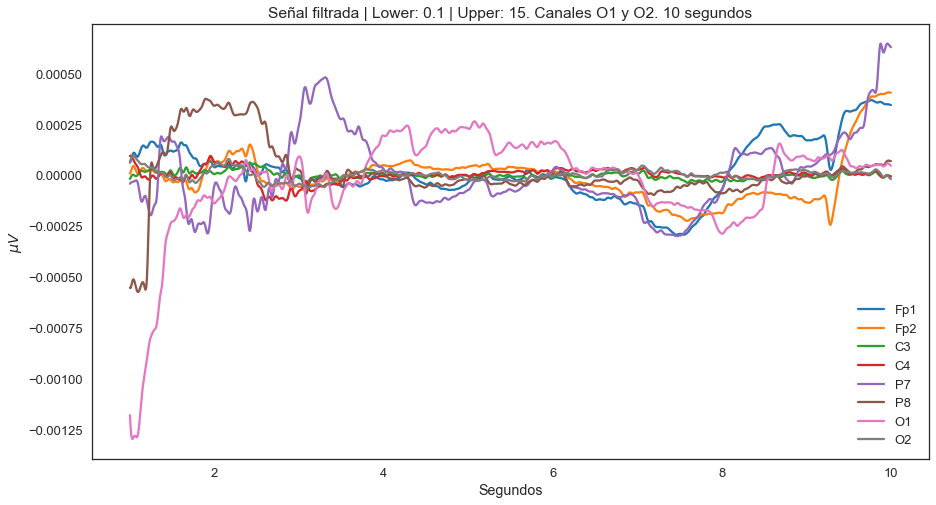

...

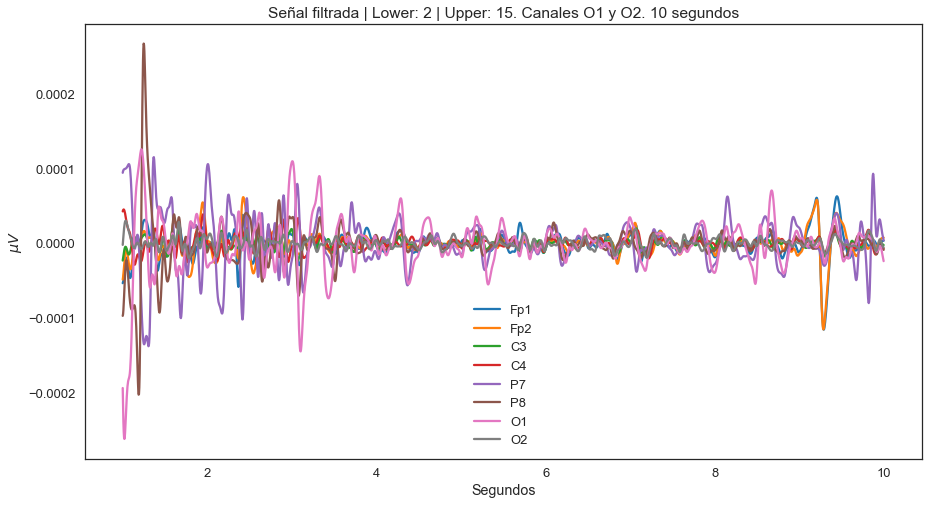

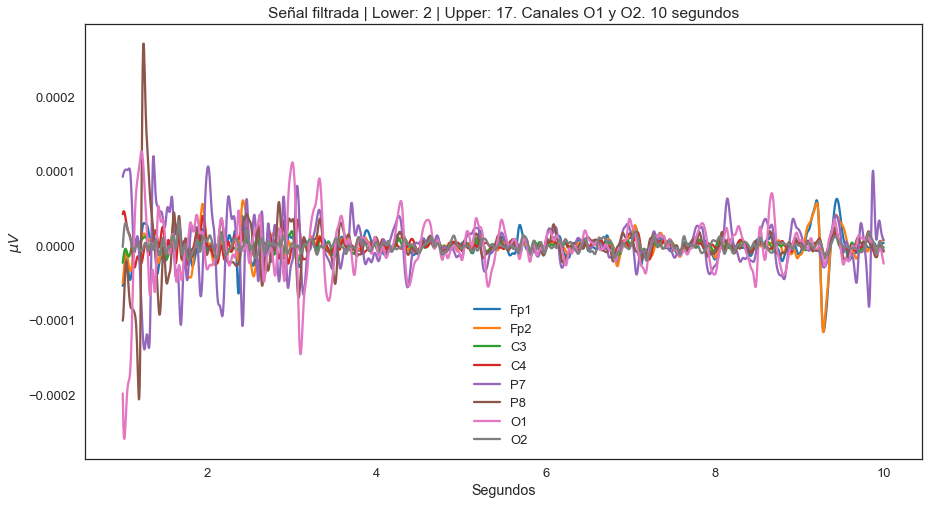

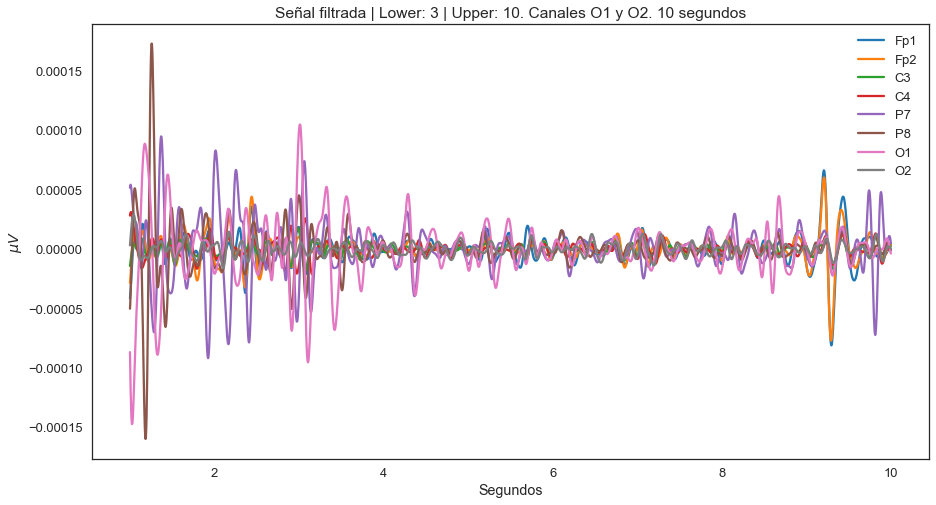

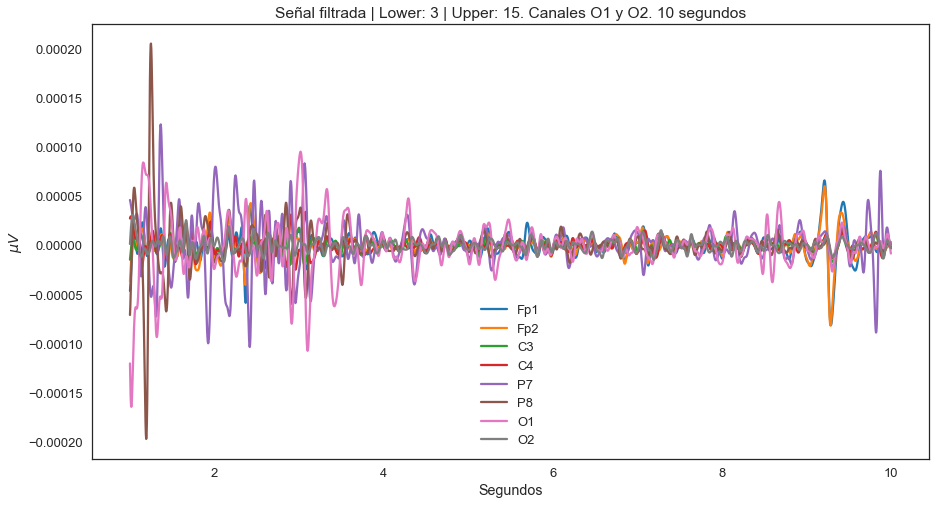

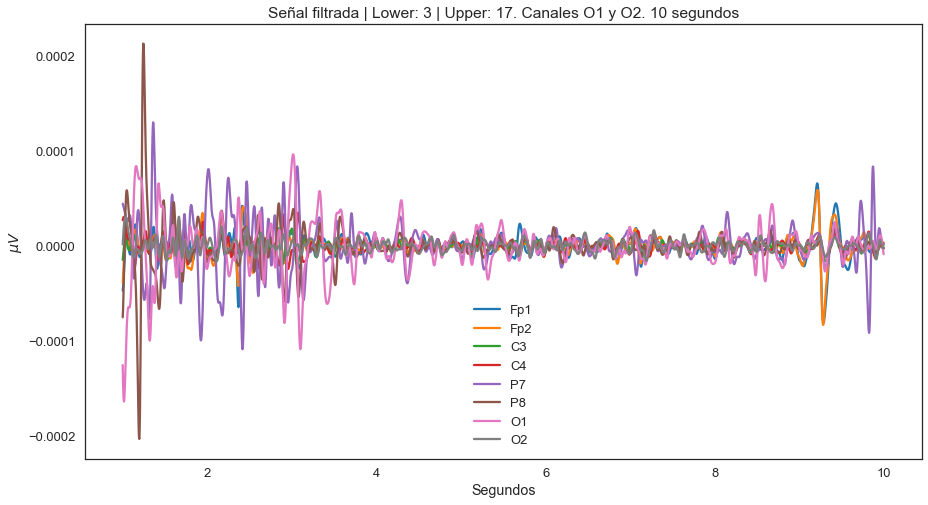

In [13]:
for lower in [None, 0.1, 1, 2, 3]:
    for upper in [10, 15, 17]:
        rawaux = raw_notch.copy().filter(lower, upper, method='iir')
        data_f, times_f = rawaux[:-1, int(sfreq * 1):int(sfreq * 10)]
        fig = plt.subplots(figsize=(15, 8))
        plt.plot(times_f, data_f.T);
        plt.xlabel('Segundos')
        plt.ylabel('$\mu V$')
        plt.title('Señal filtrada | Lower: {} | Upper: {}. Canales O1 y O2. 10 segundos'.format(lower, upper));
        plt.legend(rawaux.ch_names[:-1]);

        

### Finalmente, seleccionamos el filtrado: band-pass from 1-17Hz
#### Un filtro band-pass from 1-15Hz también puede ser de interés.
#### Las gráficas anteriores dan una perspectiva básica de los primeros 10 segundos de captura EEG y la representación que tendría la señal aplicando distintos band-pass (la información de cada parámetro utilizado se encuentra como título de la gráfica

In [14]:
raw_notch_and_filter = raw_notch.copy().filter(1, 17, method='iir')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 17 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 17.00 Hz: -6.02, -6.02 dB



## Visualización de la señal filtrada

Effective window size : 8.192 (s)


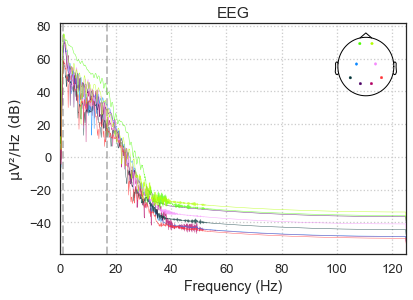

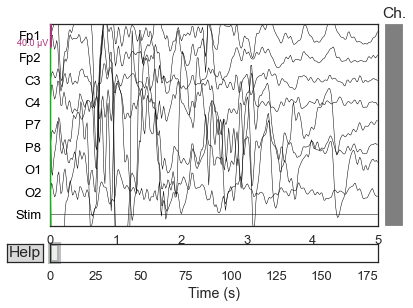

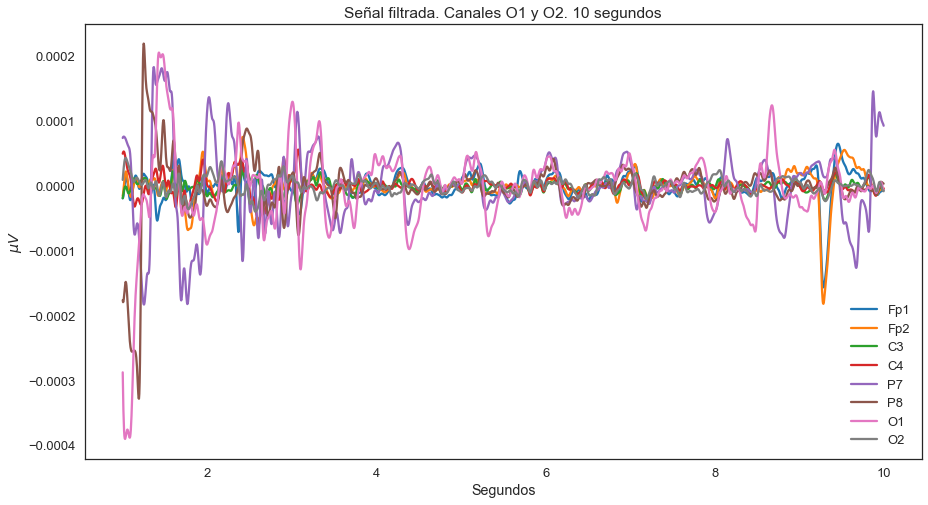

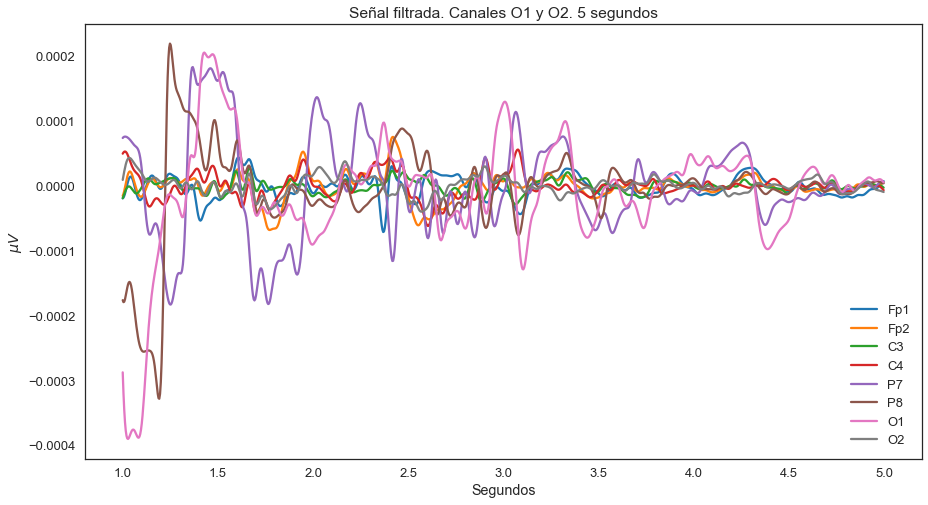

In [15]:
raw_notch_and_filter.plot_psd()
raw_notch_and_filter.plot(duration=5)
data_f, times_f = raw_notch_and_filter[:-1, int(sfreq * 1):int(sfreq * 10)]
fig = plt.subplots(figsize=(15, 8))
plt.plot(times_f, data_f.T);
plt.xlabel('Segundos')
plt.ylabel('$\mu V$')
plt.title('Señal filtrada. Canales O1 y O2. 10 segundos');
plt.legend(raw_notch_and_filter.ch_names[:-1]);


# 1 segundo
data_f_1, times_f_1 = raw_notch_and_filter[:-1, int(sfreq * 1):int(sfreq * 5)]
fig = plt.subplots(figsize=(15, 8))
plt.plot(times_f_1, data_f_1.T);
plt.xlabel('Segundos')
plt.ylabel('$\mu V$')
plt.title('Señal filtrada. Canales O1 y O2. 5 segundos');
plt.legend(raw_notch_and_filter.ch_names[:-1]);

## Comparativa raw inicial con raw_notch_and_filter 8 (no filtrada vs filtrada)

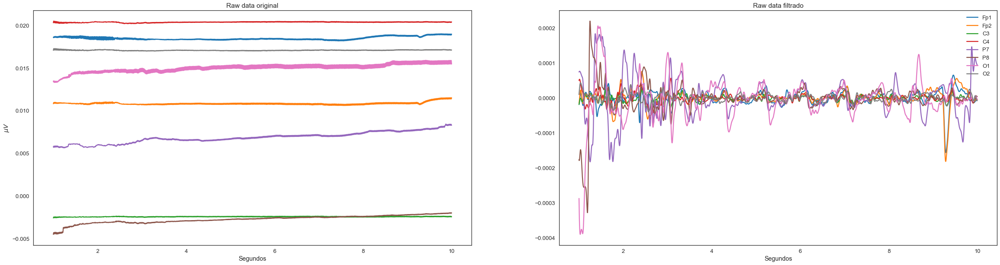

In [16]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

ax1.plot(times_ini, data_ini.T);
ax1.set_title('Raw data original')
ax1.set_xlabel('Segundos')
ax1.set_ylabel('$\mu V$')

ax2.plot(times_f, data_f.T);
ax2.set_title('Raw data filtrado')
ax2.set_xlabel('Segundos')

plt.legend(raw.ch_names[:8], loc=1);
# plt.tight_layout()


## Same anterior pero solo con canales O1 y O2

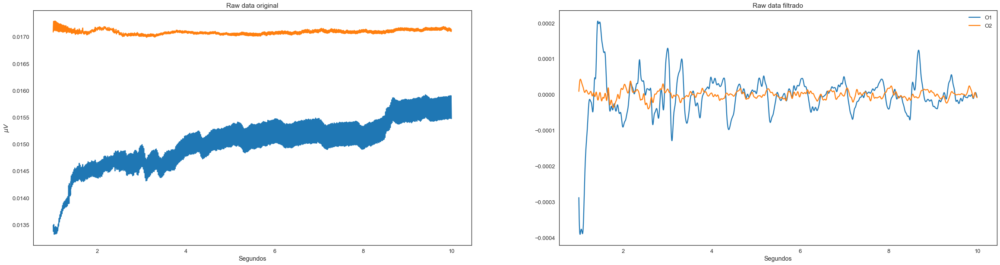

In [17]:
data_ini_occipital, times_ini_occipital = raw[-3:-1, int(sfreq * 1):int(sfreq * 10)]

data_f_occipital, times_f_occipital = raw_notch_and_filter[-3:-1, int(sfreq * 1):int(sfreq * 10)]

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

ax1.plot(times_ini_occipital, data_ini_occipital.T);
ax1.set_title('Raw data original')
ax1.set_xlabel('Segundos')
ax1.set_ylabel('$\mu V$')

ax2.plot(times_f_occipital, data_f_occipital.T);
ax2.set_title('Raw data filtrado')
ax2.set_xlabel('Segundos')

plt.legend(raw.ch_names[-3:-1], loc=1);

## Representación de la densidad espectral de potencia a través de los canales en los datos procesados

Effective window size : 8.192 (s)


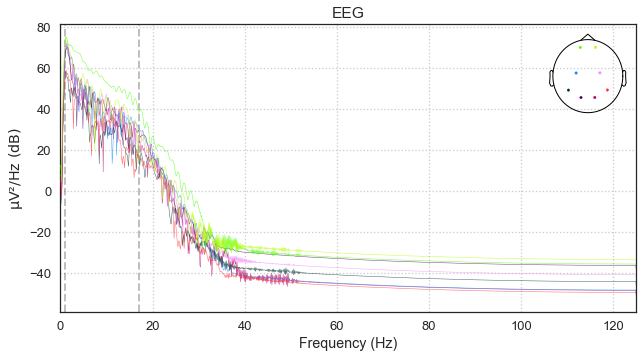

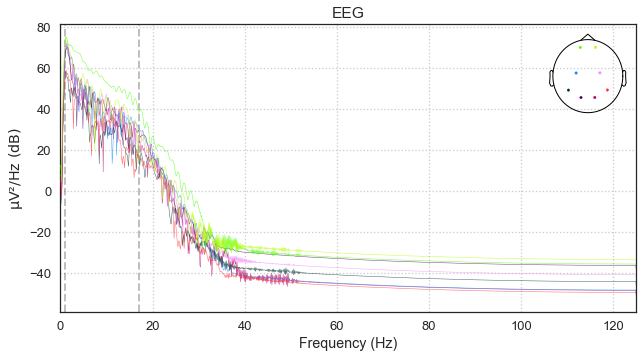

In [18]:
fig, ax = plt.subplots(figsize=(10, 5))
raw_notch_and_filter.plot_psd(ax=ax)

In [19]:
## Downsampling análisis

## Same anterior pero solo con canales O1 y O2

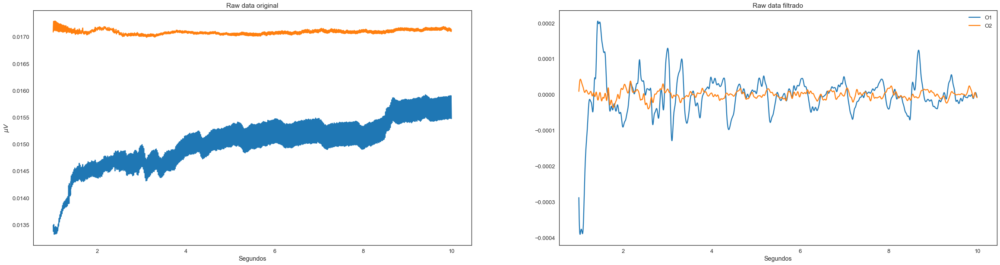

In [20]:
data_ini_occipital, times_ini_occipital = raw[-3:-1, int(sfreq * 1):int(sfreq * 10)]

data_f_occipital, times_f_occipital = raw_notch_and_filter[-3:-1, int(sfreq * 1):int(sfreq * 10)]

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

ax1.plot(times_ini_occipital, data_ini_occipital.T);
ax1.set_title('Raw data original')
ax1.set_xlabel('Segundos')
ax1.set_ylabel('$\mu V$')

ax2.plot(times_f_occipital, data_f_occipital.T);
ax2.set_title('Raw data filtrado')
ax2.set_xlabel('Segundos')

plt.legend(raw.ch_names[-3:-1], loc=1);

## Representación de la densidad espectral de potencia a través de los canales en los datos procesados

Effective window size : 8.192 (s)


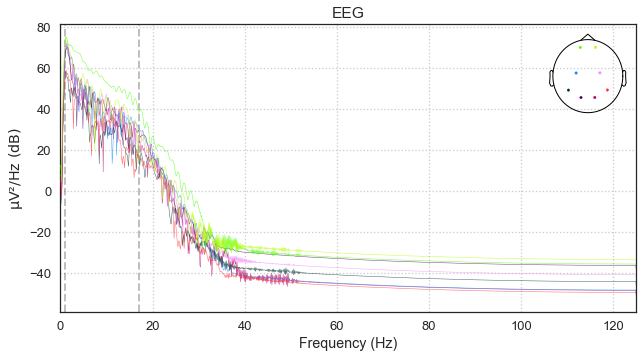

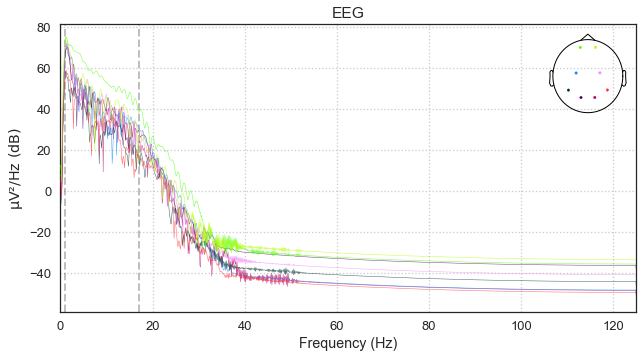

In [21]:
fig, ax = plt.subplots(figsize=(10, 5))
raw_notch_and_filter.plot_psd(ax=ax)

## Downsampling análisis

Frecuencia de muestreo (OLD):  250.0 Hz
111 events found
Event IDs: [1 2]
111 events found
Event IDs: [1 2]
Frecuencia de muestreo (NEW):  50.0 Hz


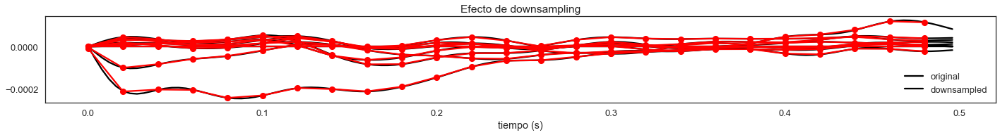

In [22]:
print('Frecuencia de muestreo (OLD): ', raw_notch_and_filter.info['sfreq'], 'Hz')


# Plot a piece of data to see the effects of downsampling
plt.figure(figsize=(20, 3))

n_samples_to_plot = int(0.5 * raw_notch_and_filter.info['sfreq'])  # plot 0.5 seconds of data
data, times = raw_notch_and_filter[:, :n_samples_to_plot]
plt.plot(times,data.T, color='black')


# Downsampling
raw_notch_and_filter_downsamp = raw_notch_and_filter.copy()
raw_notch_and_filter_downsamp.resample(50, npad="auto")
print('Frecuencia de muestreo (NEW): ', raw_notch_and_filter_downsamp.info['sfreq'], 'Hz')

n_samples_to_plot = int(0.5 * raw_notch_and_filter_downsamp.info['sfreq'])  # plot 0.5 seconds of data
data, times = raw_notch_and_filter_downsamp[:, :n_samples_to_plot]
plt.plot(times,data.T,'-o', color='red')

plt.xlabel('tiempo (s)')
plt.legend(['original', 'downsampled'], loc='best')
plt.title('Efecto de downsampling')
mne.viz.tight_layout()




## Preprocesamiento ICA

In [23]:
# # set up and fit the ICA
# # Buscar ejemplo para ver ICA usado
# ica = mne.preprocessing.ICA(random_state=97, max_iter=800)
# ica.fit(raw_notch_and_filter)
# ica.exclude = [0,1]  # details on how we picked these are omitted here
# ica.plot_properties(raw_notch_and_filter, picks=ica.exclude)

- Aplicamos ICA y comparamos

In [24]:
# raw_notch_and_filter_ica = raw_notch_and_filter.copy()
# raw_notch_and_filter_ica.load_data()
# ica.apply(raw_notch_and_filter_ica)

# raw_notch_and_filter.plot(start=12, duration=4)
# raw_notch_and_filter_ica.plot(start=12, duration=4)


## High pass a la señal

In [25]:
# # High pass filtering below 50 Hz
# raw_high = raw.copy().filter(.1, None, fir_design='firwin')
# data, times = raw_high[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw_high.ch_names[:channels_to_plot]);

## Low y High pass filter

In [26]:
# raw_filter = raw.copy()
# raw_filter.filter(.1, None, fir_design='firwin')
# raw_filter.filter(None, 12., fir_design='firwin')
# data, times = raw_filter[:channels_to_plot, int(sfreq * 1):int(sfreq * 10)]

# fig = plt.subplots(figsize=(10, 8))
# plt.plot(times, data.T);
# plt.xlabel('Seconds')
# plt.ylabel('$\mu V$')
# plt.title('Channels: 1-2');
# plt.legend(raw_filter.ch_names[:channels_to_plot]);

## Se obtienen los eventos producidos

In [27]:
events = find_events(raw_notch_and_filter_downsamp, shortest_event=1) #
print('Found %s events, first five:' % len(events))
print(events[:5])

111 events found
Event IDs: [1 2]
Found 111 events, first five:
[[3868    0    2]
 [3893    0    2]
 [3918    0    2]
 [3943    0    2]
 [3968    0    2]]


## Creamos la clase Epochs con los eventos obtenidos, los events_id y el rawdata

Una época o "epoch" hace referencia a una traza de posible P300.

Básicamente parte de los eventos encontrados y componen traza con -0.1 segundos antes del evento y 0.8 después del evento.

## Definimos baseline y lo aplicamos a la clase Epochs

In [28]:
baseline = (None, 0)

In [29]:
event_id = {'Target': 1, 'NoTarget': 2}
reject = {'eeg': 100e-6}


epochs = Epochs(raw_notch_and_filter_downsamp, events=events, event_id=event_id, tmin=-0.1, tmax=0.8, reject=reject, baseline=None, preload=True)
print(epochs)
# 'add_eeg_ref' False
epochs.pick_types(eeg=True)


111 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 111 events and 46 original time points ...
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['P7']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2', 'O1']
14 bad epochs dropped
<Epochs  |   97 events (all good), -0.1 - 0.8 sec, baseline off, ~344 kB, data loaded,
 'NoTarget': 92
 'Target': 5>


<Epochs  |   97 events (all good), -0.1 - 0.8 sec, baseline off, ~307 kB, data loaded,
 'NoTarget': 92
 'Target': 5>

## % de épocas rechazadas

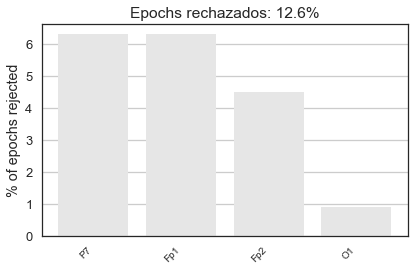

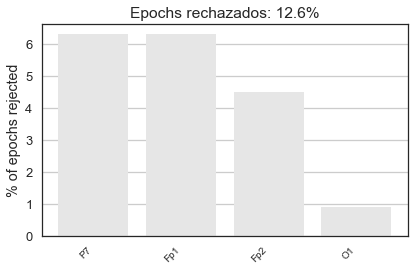

In [30]:
epochs.plot_drop_log(subject="Epochs rechazados")

## Se muestran la ubicación de los sensores utilizados en el experimento

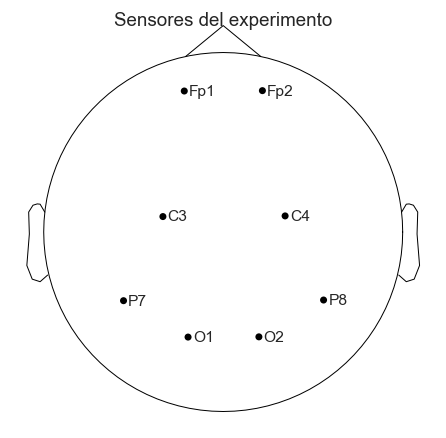

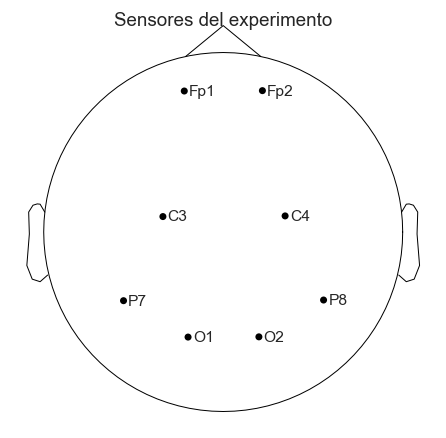

In [31]:
epochs.plot_sensors(kind='topomap', ch_type='eeg', title="Sensores del experimento", show_names=True)

## Análisis de los eventos Target en la señal EEG

################################ Estímulo #14 ################################


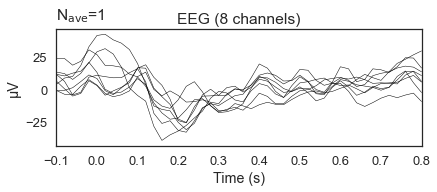

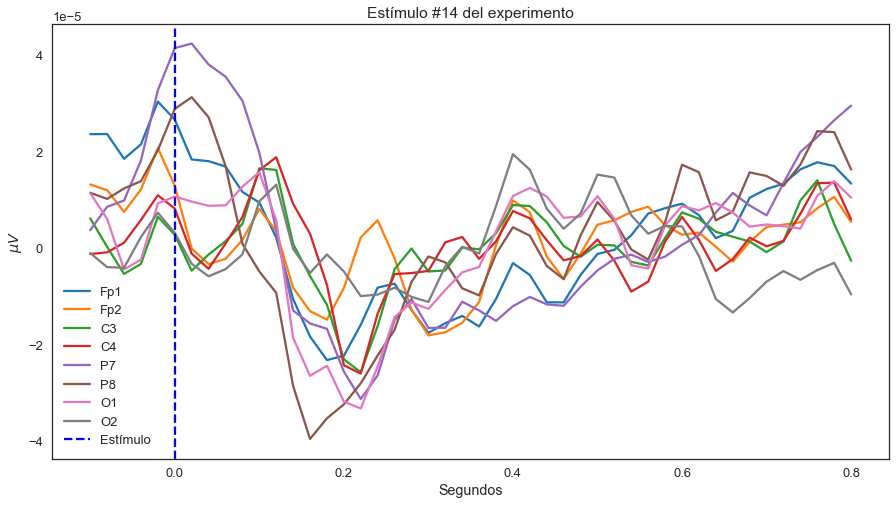

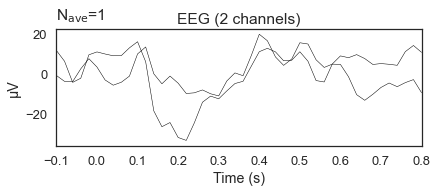

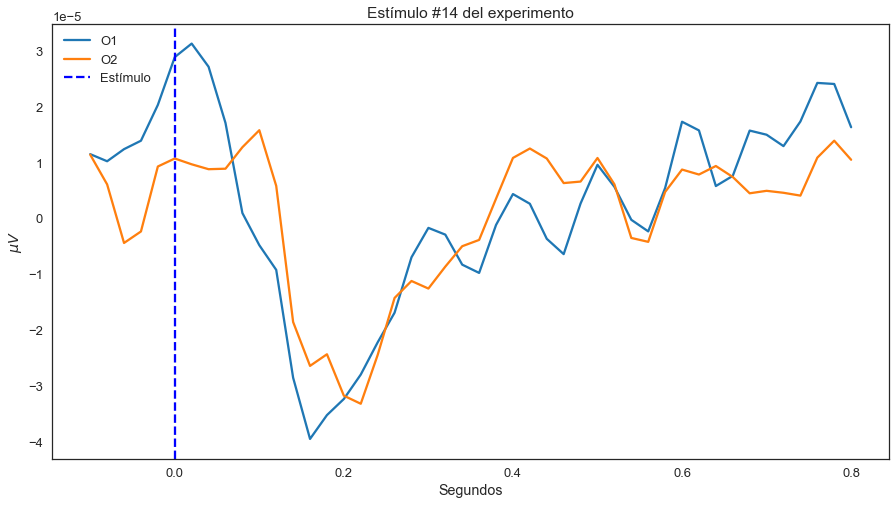

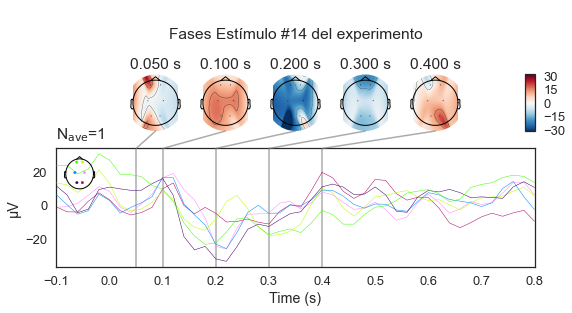

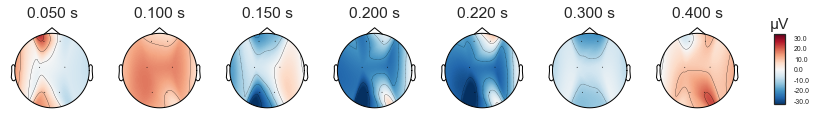

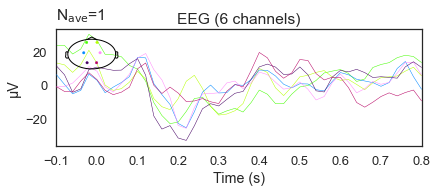

################################ Estímulo #33 ################################


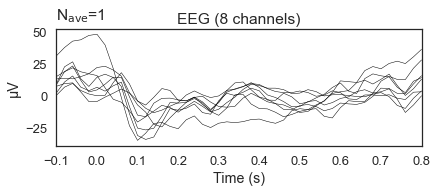

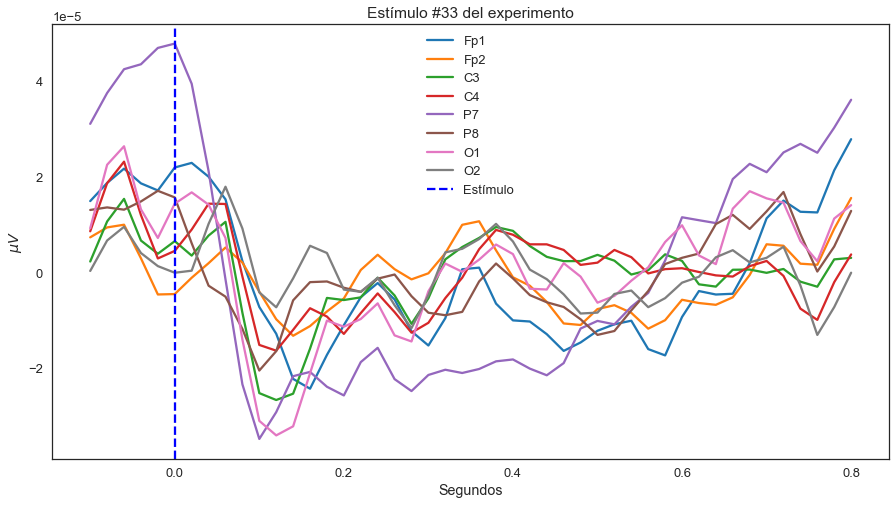

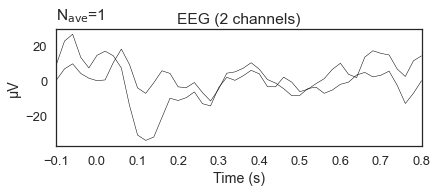

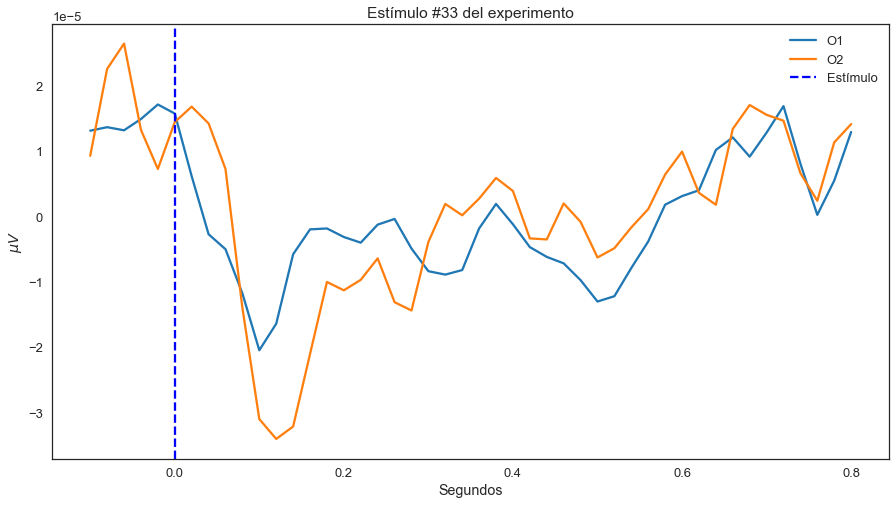

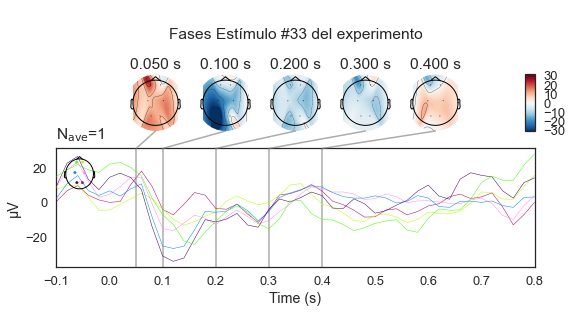

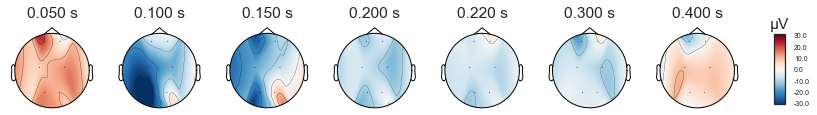

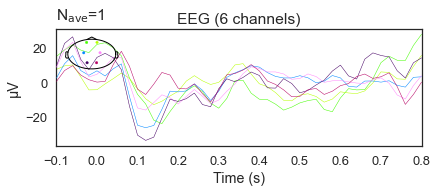

################################ Estímulo #41 ################################


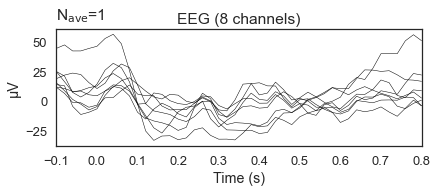

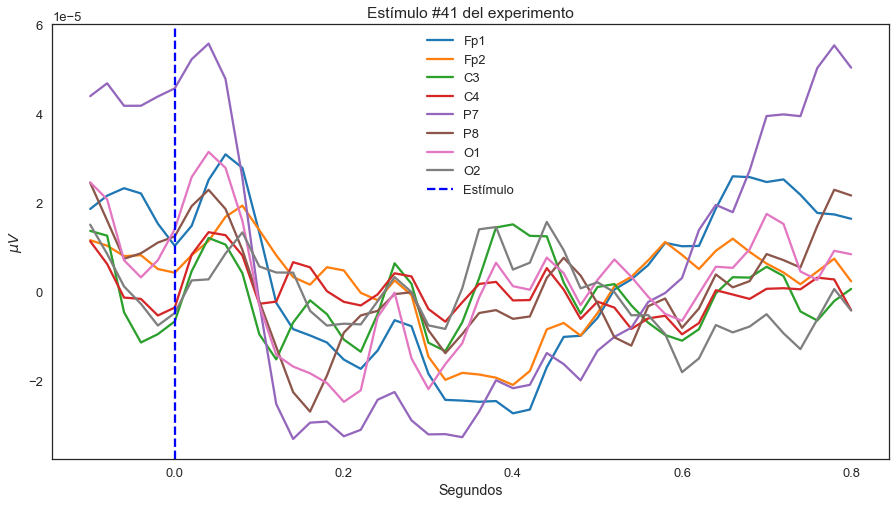

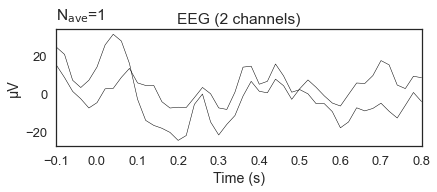

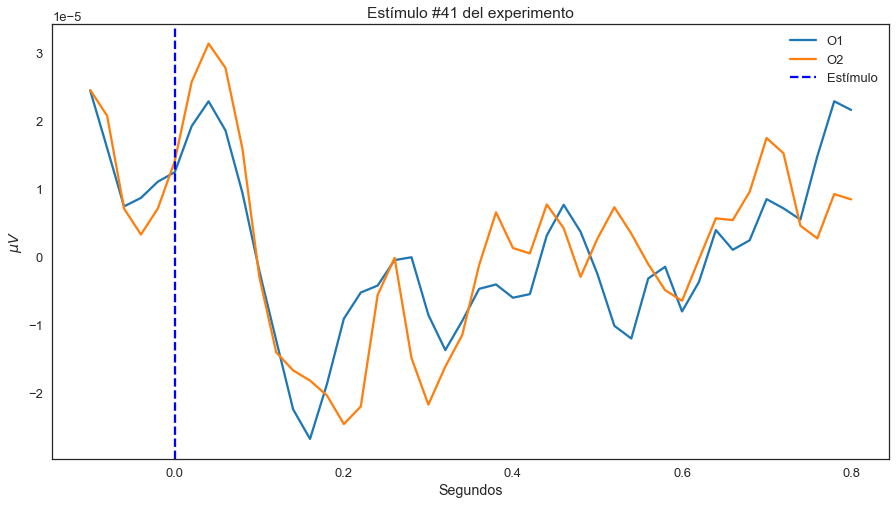

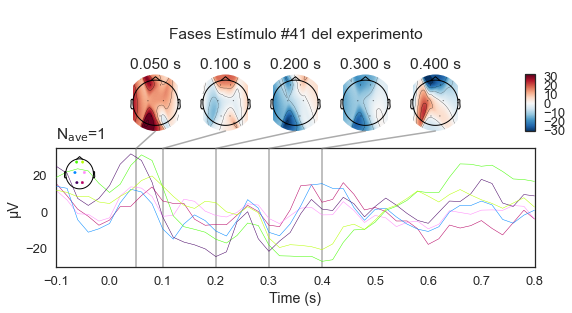

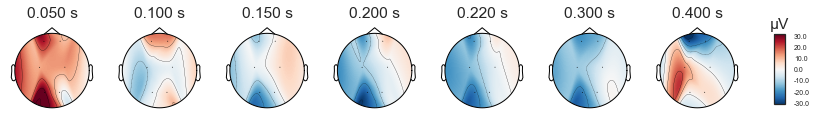

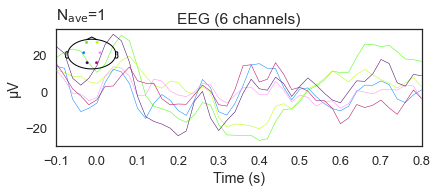

################################ Estímulo #68 ################################


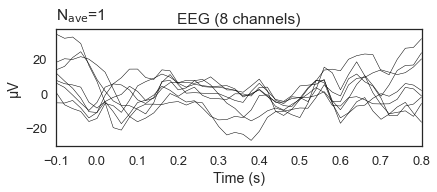

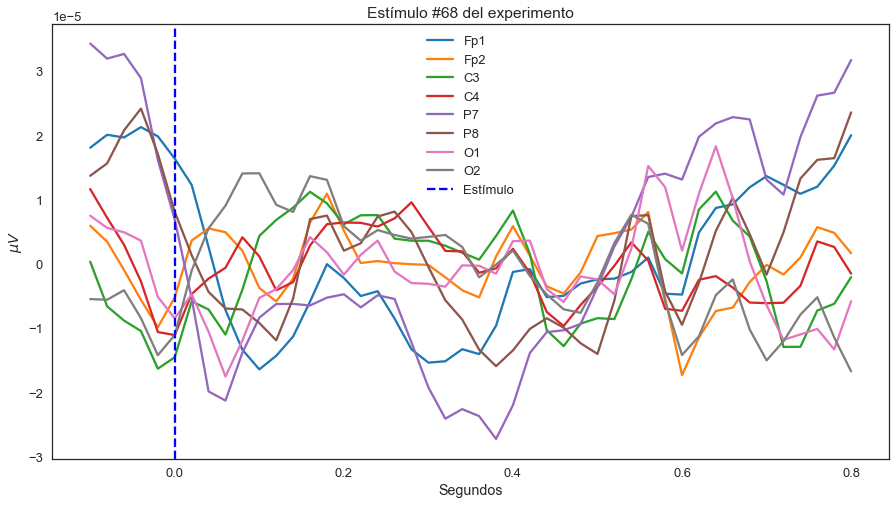

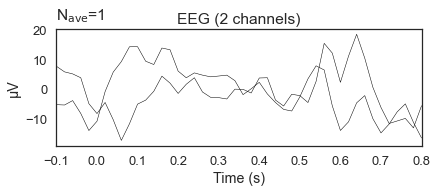

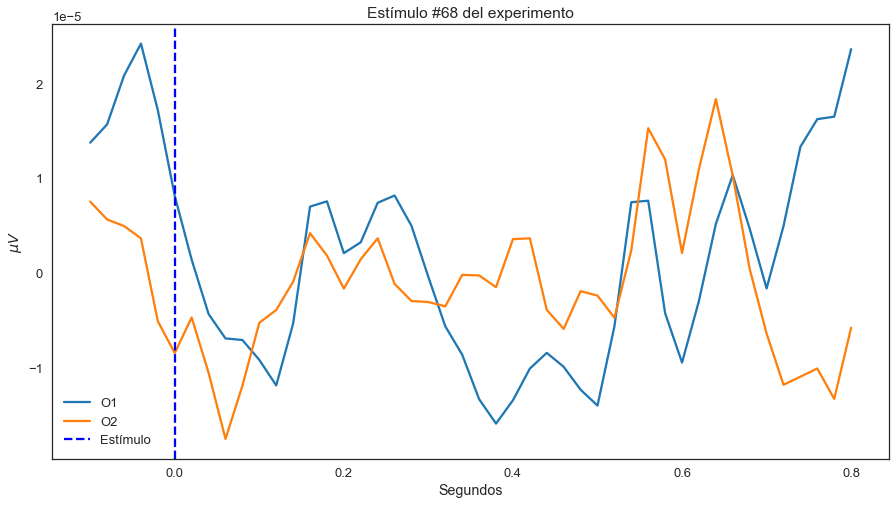

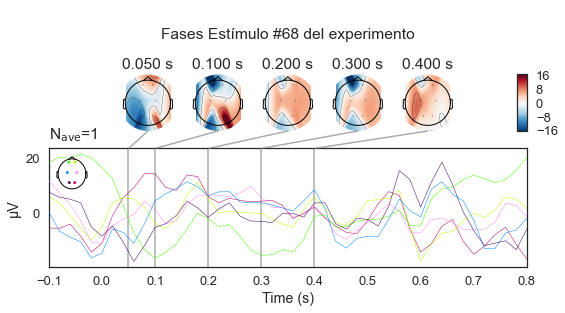

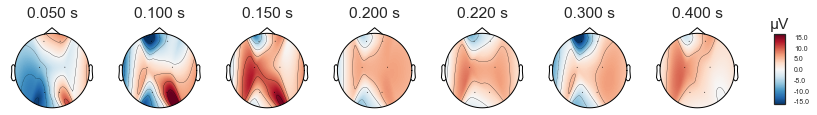

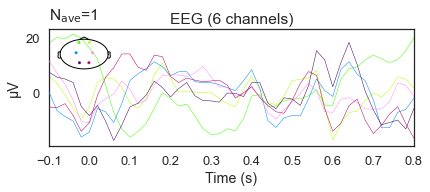

################################ Estímulo #84 ################################


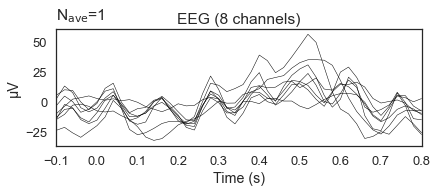

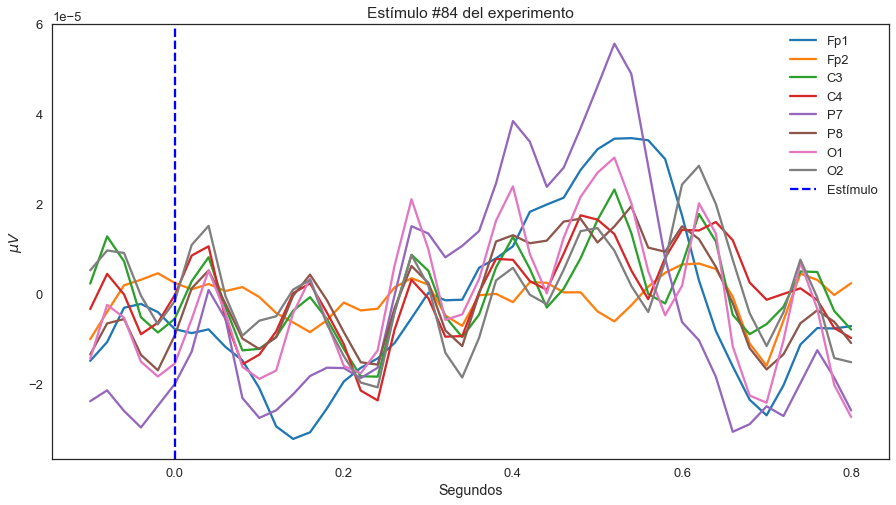

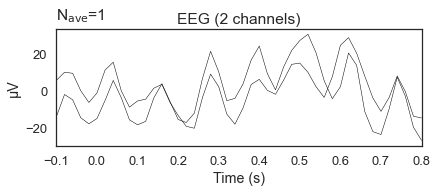

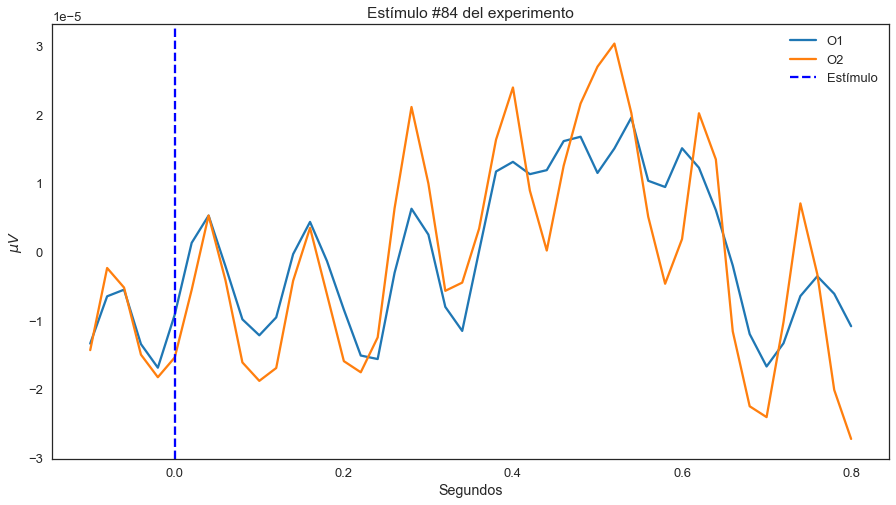

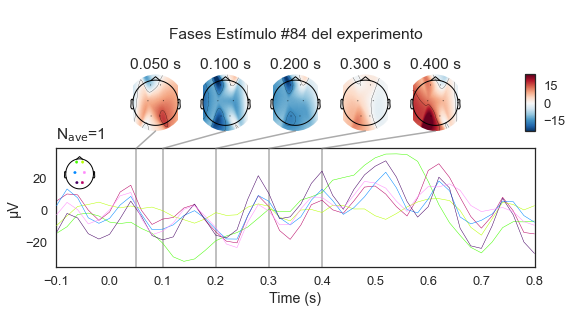

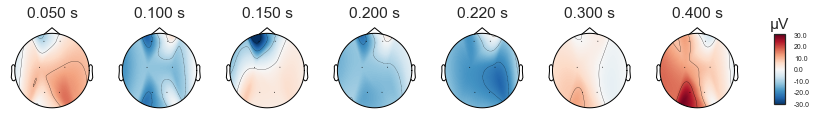

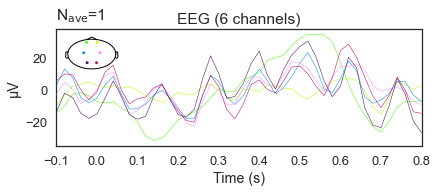

In [32]:
# for ep in epochs:
#     print(ep)

#data_ini_occipital, times_ini_occipital = raw[-3:-1, int(sfreq * 1):int(sfreq * 10)]
def plot_all_evoked():
    mne.viz.plot_evoked(ev)
    fig = plt.subplots(figsize=(15, 8))
    plt.plot(ev.times, ev.data.T);
    plt.axvline(x=0, c='b', linestyle='--')
    plt.xlabel('Segundos')
    plt.ylabel('$\mu V$')
    title = 'Estímulo #{} del experimento'.format(ii)
    plt.title(title);
    plt.legend(raw.ch_names[:-1] + ["Estímulo"]);

def plot_occipital_evoked():
    mne.viz.plot_evoked(ev, picks=['O1', 'O2'])
    fig, ax = plt.subplots(figsize=(15, 8))
    plt.plot(ev.times, ev.data[-3:-1].T);
    plt.axvline(x=0, c='b', linestyle='--')
    plt.xlabel('Segundos')
    plt.ylabel('$\mu V$')
    title = 'Estímulo #{} del experimento'.format(ii)
    plt.title(title);
    plt.legend(raw.ch_names[-3:-1] + ["Estímulo"]);
    # Para excluir los electrodos laterales -> distorsionan la figura.
    title = 'Fases Estímulo #{} del experimento'.format(ii)
    ev.plot_joint(times=[0.05, 0.1, 0.2, 0.3, 0.4], title=title, exclude=['P7', 'P8'])
    

for ii, ev in enumerate(epochs.iter_evoked(True)):
    if (ev.comment == '1'):
        print("################################ Estímulo #{} ################################".format(ii))
        plot_all_evoked()
        plot_occipital_evoked()
        ev.pick(['eeg'], exclude=['FP1', 'FP2', 'P7', 'P8'])
#         fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
        fig = ev.plot_topomap(times=[0.05, 0.1, 0.15, 0.2, 0.22, 0.3, 0.4], ch_type='eeg', colorbar=True)

        ev.plot(picks='eeg', spatial_colors=True)
        
    

In [33]:
import numpy as np

# Ugly hack due to acquisition problem when specifying the channel types
# layout = mne.channels.read_layout('Vectorview-mag.lout')
# layout.names = mne.utils._clean_names(layout.names, remove_whitespace=True)

# fig = epochs['Target'].average().plot_topomap(times=np.linspace(0.05, 0.12, 5), ch_type='eeg', layout=layout)
# fig = epochs['Target'].average().plot_topomap(times=np.linspace(0.05, 0.12, 5), ch_type='eeg')

## Ploteamos la clase Epochs

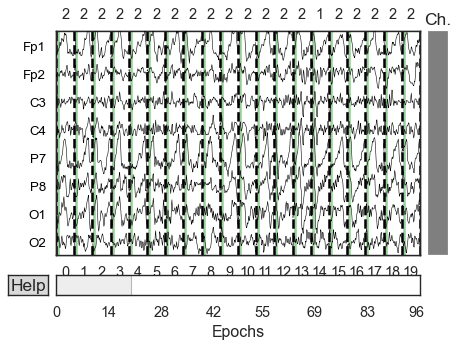

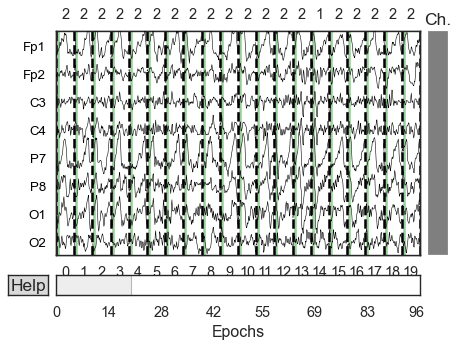

In [34]:
epochs.plot(scalings='auto', block=True)

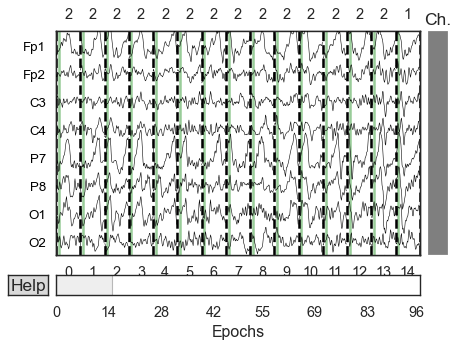

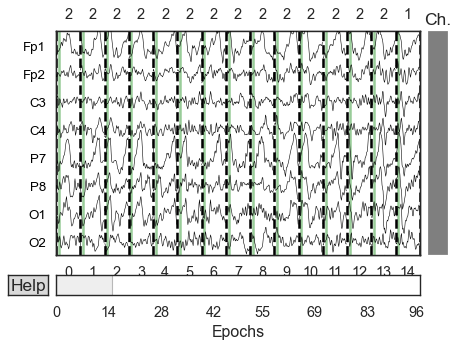

In [35]:
epochs.plot(title='Eventos de la señal EEG', n_epochs=15, scalings='auto', block=True)

## Compute ICA components on epochs ---> XDAWN is better?
- https://mne.tools/dev/auto_examples/preprocessing/plot_run_ica.html

## XDAWN

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


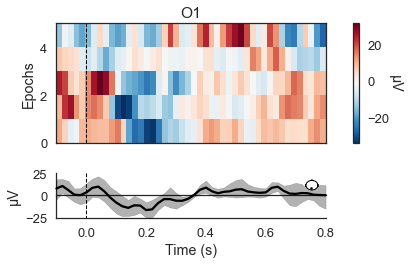

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


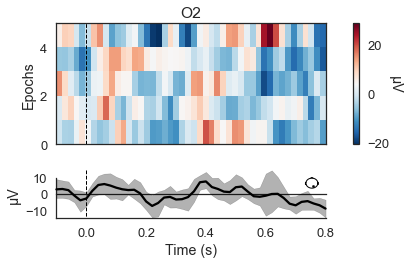

[<Figure size 432x288 with 4 Axes>]

In [36]:
mne.viz.plot_epochs_image(epochs['Target'], picks=['O1'], vmin=lambda data: data.min(), evoked=True)
mne.viz.plot_epochs_image(epochs['Target'], picks=['O2'], vmin=lambda data: data.min(), evoked=True)


In [37]:
from mne.preprocessing import Xdawn

# Estimates signal covariance
signal_cov = mne.compute_raw_covariance(raw_notch_and_filter_downsamp, picks='eeg')

# Xdawn instance
xd = Xdawn(n_components=2, signal_cov=signal_cov)

# Fit xdawn
xd.fit(epochs)

Using up to 905 segments
Number of samples used : 9050
[done]
Computing rank from data with rank='full'
    EEG: rank 8 from info
Reducing data rank from 8 -> 8
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank='full'
    EEG: rank 8 from info
Reducing data rank from 8 -> 8
Estimating covariance using EMPIRICAL
Done.


Xdawn(correct_overlap='auto', n_components=2, reg=None,
   signal_cov=<Covariance  |  size : 8 x 8, n_samples : 9049, data : [[ 1.96701e-05  8.98676e-06  5.78036e-06  6.15317e-06 -7.15761e-08
  -3.11448e-07  4.55359e-06  5.24471e-06]
 [ 8.98676e-06  1.05567e-05  1.40411e-06  1.83905e-06 -3.65669e-07
  -5.06884e-07  1.58356e-06  3.72918e-06]
 [ 5.78036e-06  ...e-06  3.72918e-06  2.27973e-06  2.96267e-06 -1.63962e-07
  -2.19906e-07  2.47480e-06  3.98793e-06]]>)

Transforming to Xdawn space
Zeroing out 6 Xdawn components
Inverse transforming to sensor space
Transforming to Xdawn space
Zeroing out 6 Xdawn components
Inverse transforming to sensor space
97 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


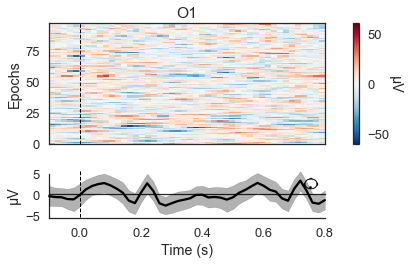

97 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


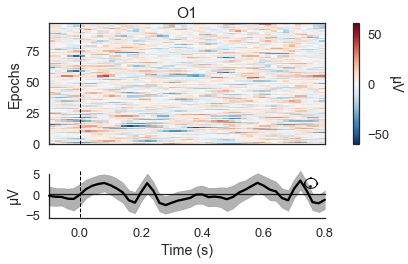

[<Figure size 432x288 with 4 Axes>]

In [38]:
epochs_denoised = xd.apply(epochs)

# Plot image epoch after Xdawn
mne.viz.plot_epochs_image(epochs_denoised['Target'], picks=['O1'], vmin=-60, vmax=60)
mne.viz.plot_epochs_image(epochs_denoised['Target'], picks=['O1'], vmin=-60, vmax=60)

## Comprobación de la computación XDAWN

{'Target': <Epochs  |   97 events (all good), -0.1 - 0.8 sec, baseline off, ~307 kB, data loaded,
 'NoTarget': 92
 'Target': 5>, 'NoTarget': <Epochs  |   97 events (all good), -0.1 - 0.8 sec, baseline off, ~307 kB, data loaded,
 'NoTarget': 92
 'Target': 5>}
################################ Estímulo #14 ################################


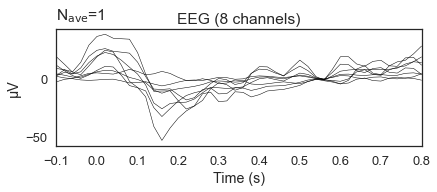

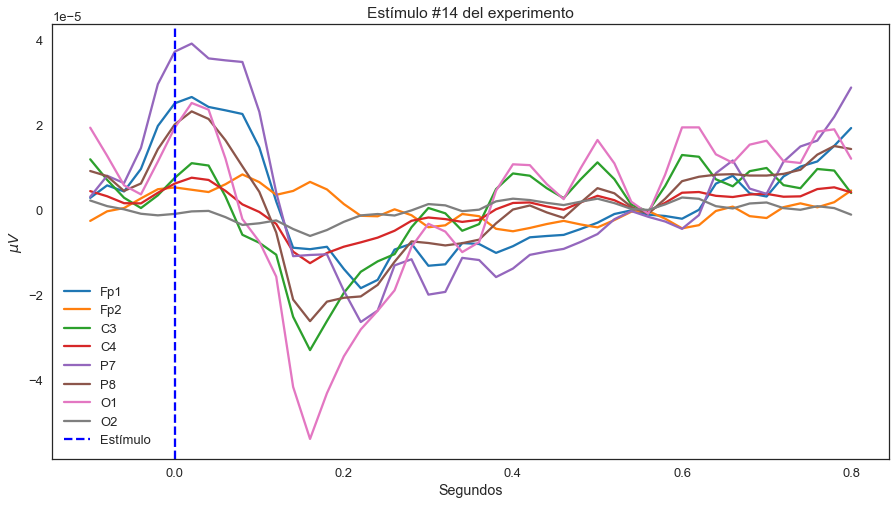

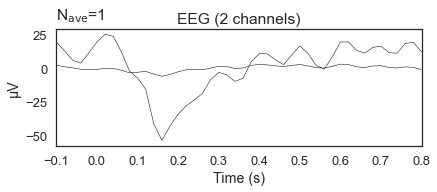

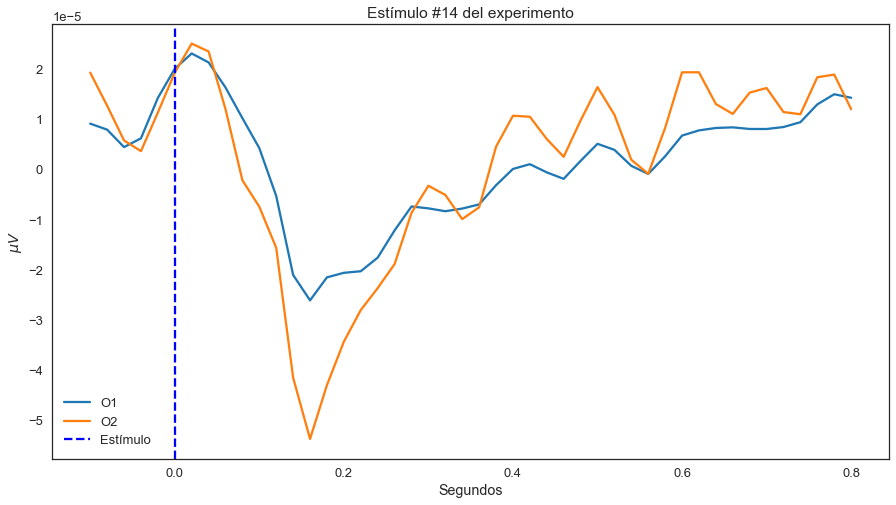

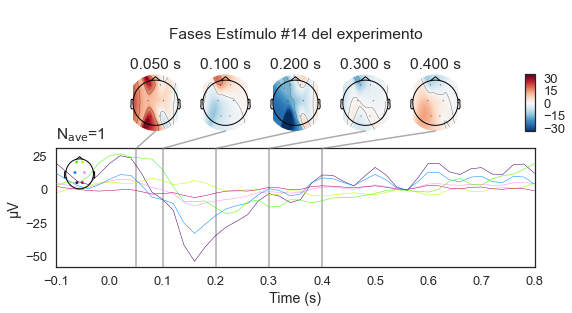

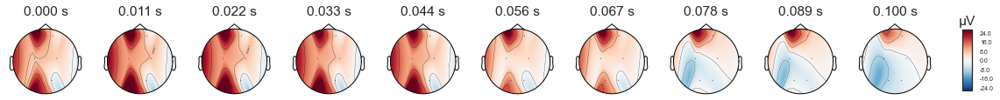

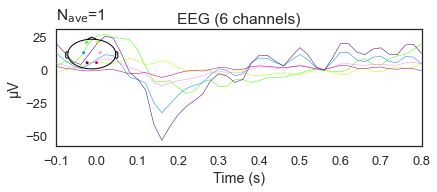

################################ Estímulo #33 ################################


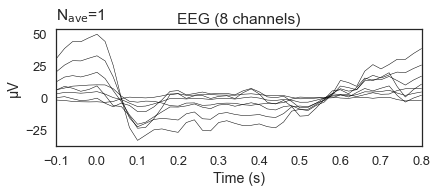

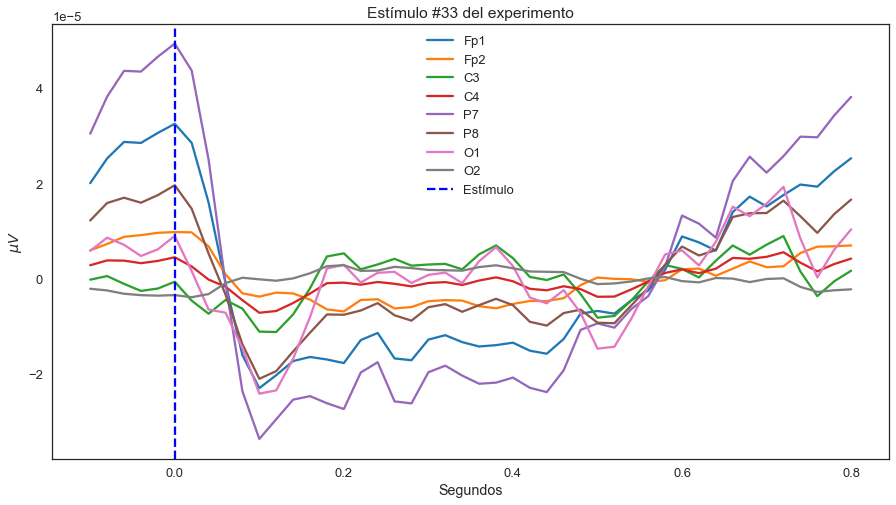

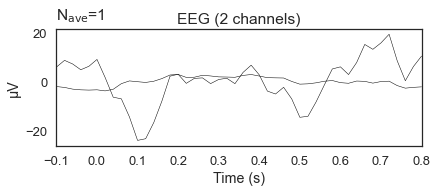

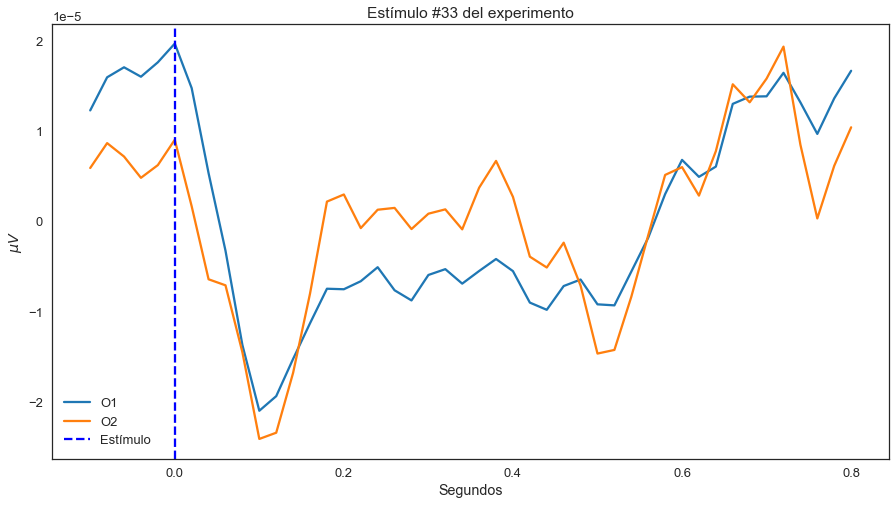

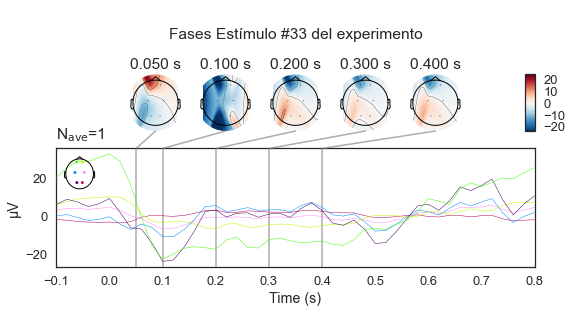

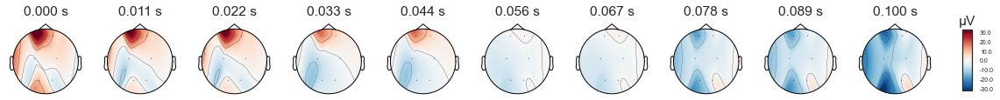

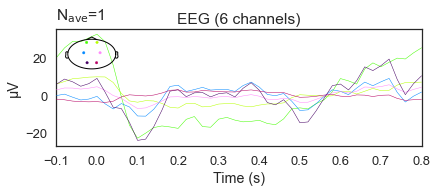

################################ Estímulo #41 ################################


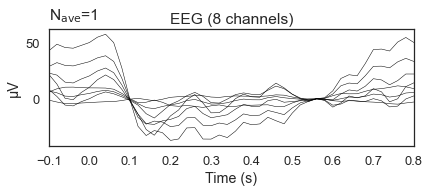

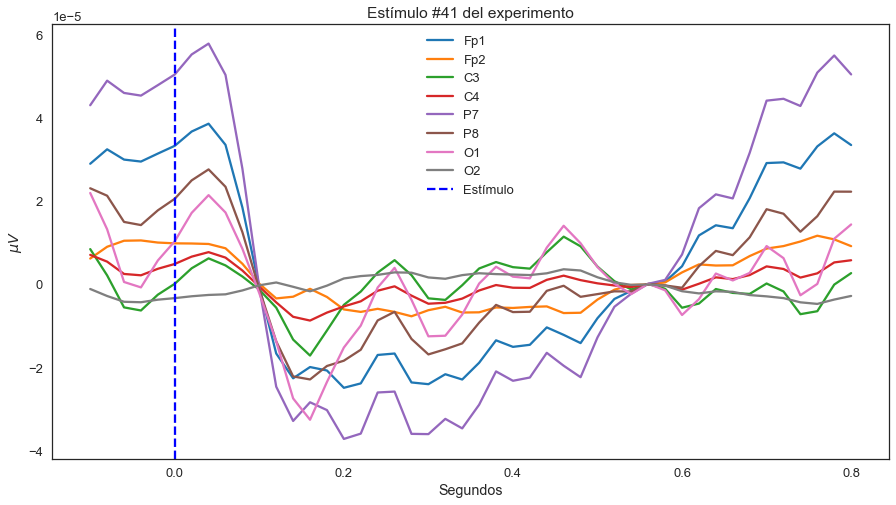

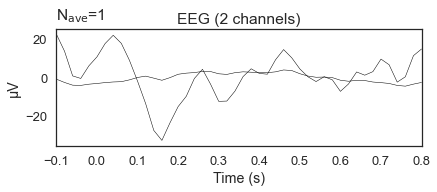

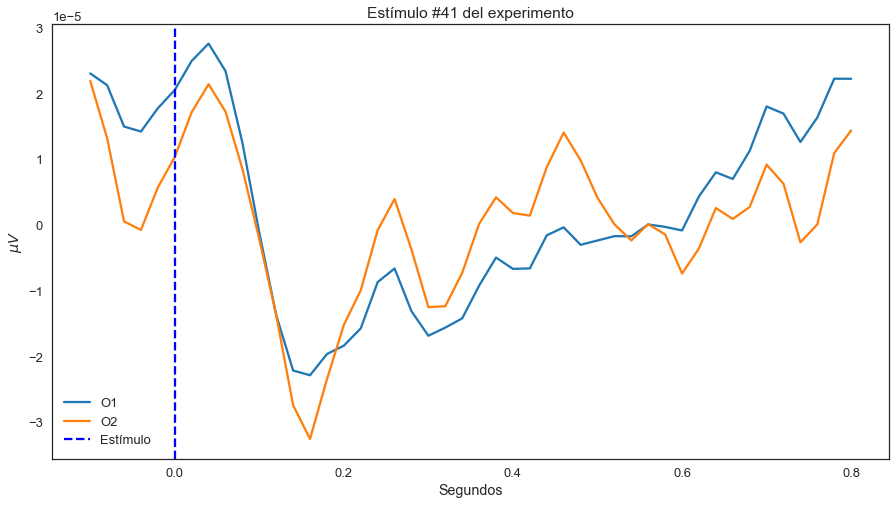

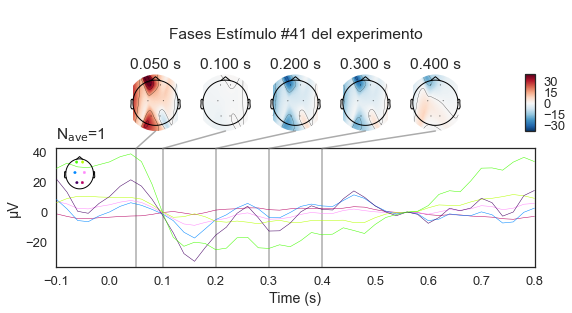

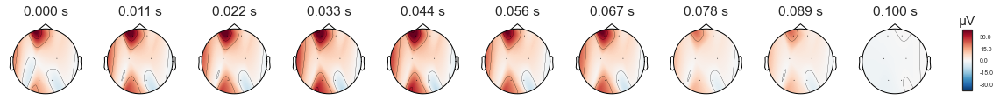

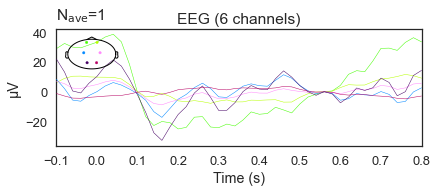

################################ Estímulo #68 ################################


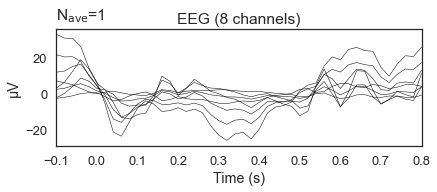

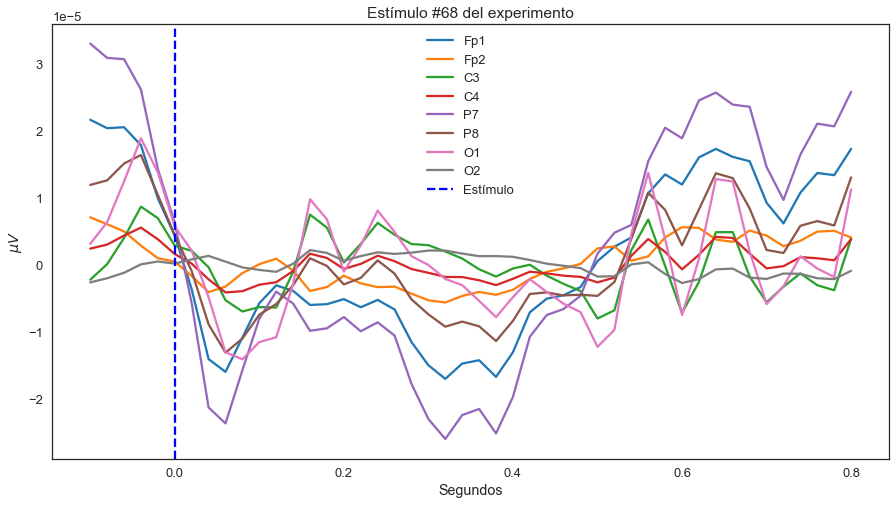

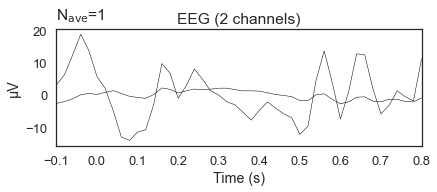

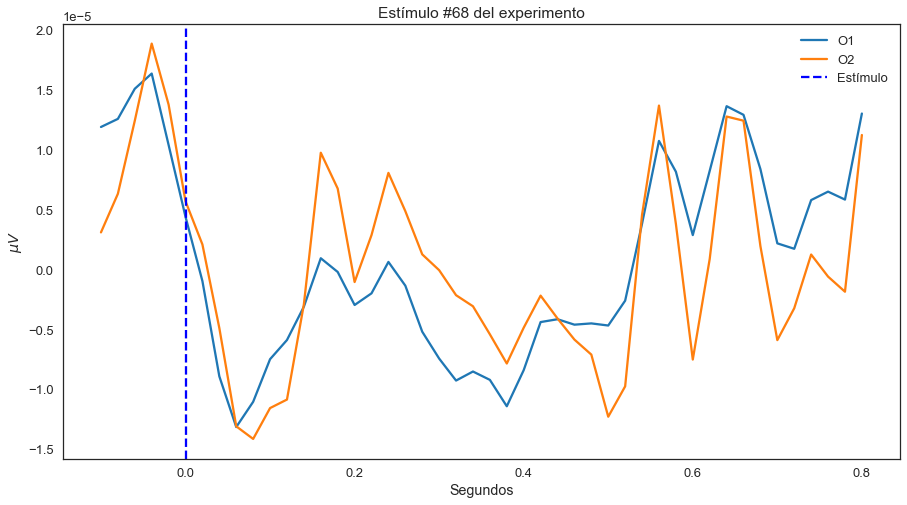

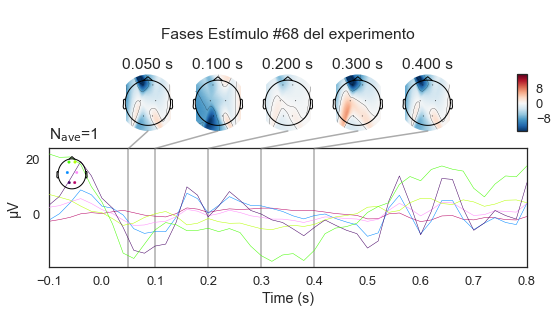

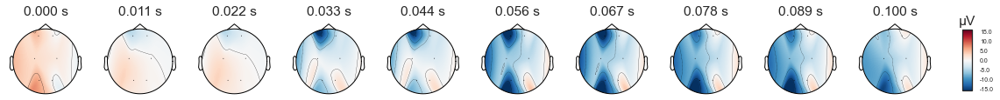

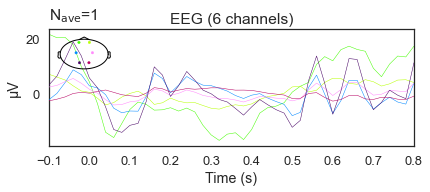

################################ Estímulo #84 ################################


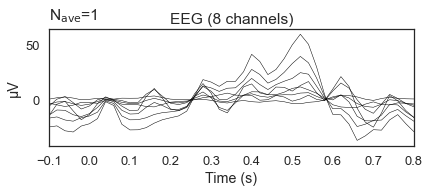

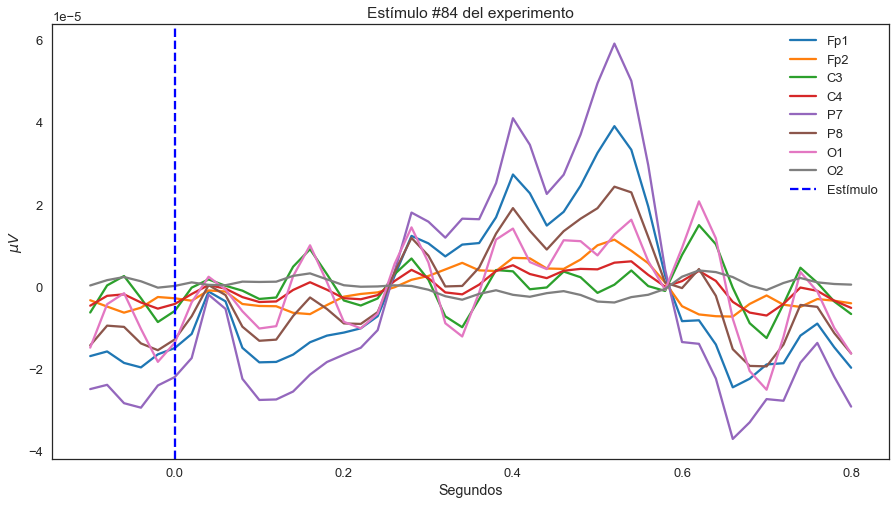

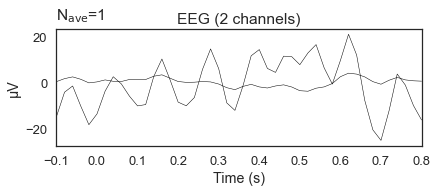

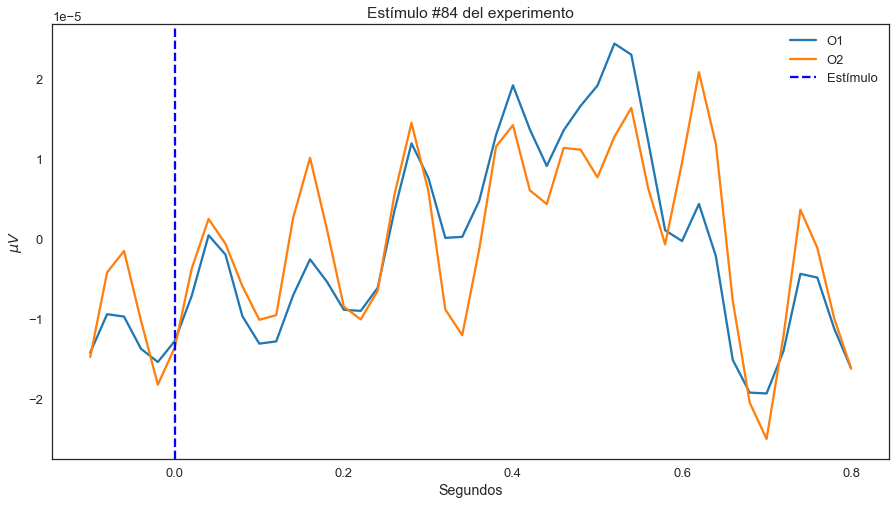

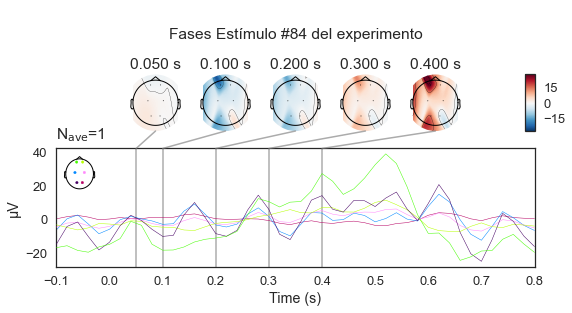

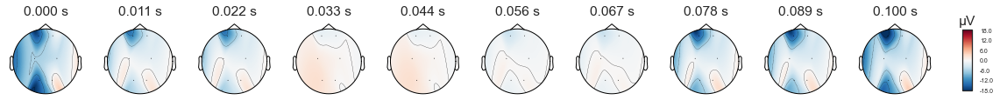

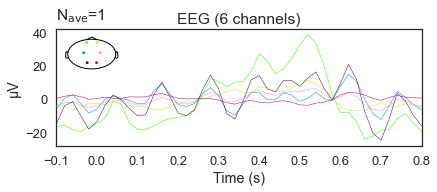

In [39]:
print(epochs_denoised)
for ii, ev in enumerate(epochs_denoised['Target'].iter_evoked(True)):
    if (ev.comment == '1'):
        print("################################ Estímulo #{} ################################".format(ii))
        plot_all_evoked()
        plot_occipital_evoked()
        ev.pick(['eeg'], exclude=['P7', 'P8'])
        fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
        ev.plot(picks='eeg', spatial_colors=True)

## Según las representaciones, no atenúa el ruido la computación XDAWN
#### Mejor no incluirlo en el análisis

## Otra representación útil es obtener la media de todas las épocas con posibles P300

#### El único problema es que si en alguna época no se ha capturado un P300, afectará notablemente a la media producida. Esto es un inconveniente si en alguna época tenemos un P300 claro.

## Obtenemos gráfica media de los potenciales evocados en cada electrodo colocado

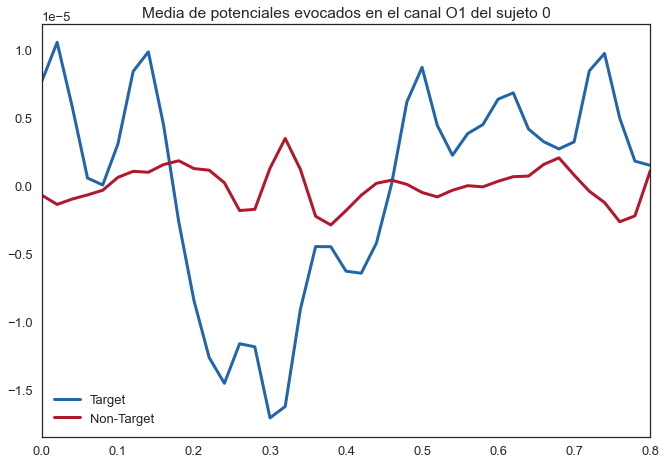

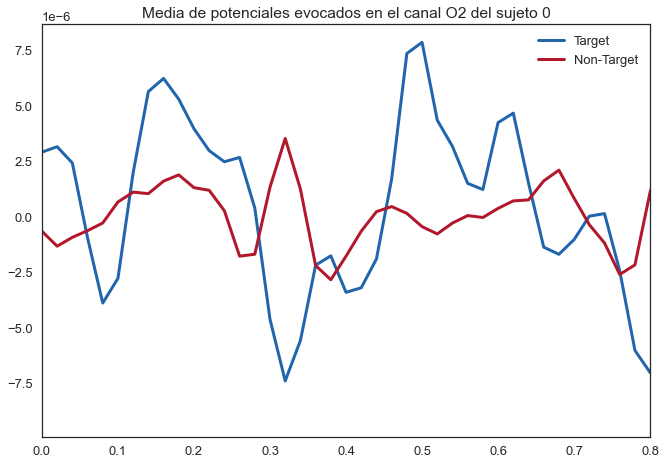

In [40]:
fig, ax = plt.subplots(facecolor='white', figsize=(10.9, 7.6))
evkTarget = epochs['Target'].average().data[ch_names['O1'], :]
evkNoTarget = epochs['NoTarget'].average().data[ch_names['O1'], :]
t = np.arange(len(evkTarget)) / epochs.info['sfreq']
ax.plot(t, evkTarget, c='#2166ac', lw=3.0, label='Target')
ax.plot(t, evkNoTarget, c='#b2182b', lw=3.0, label='Non-Target')
ax.set_xlim(0, 0.8)
ax.set_title('Media de potenciales evocados en el canal O1 del sujeto ' + str(subject))
ax.legend()


fig, ax = plt.subplots(facecolor='white', figsize=(10.9, 7.6))
evkTarget = epochs['Target'].average().data[ch_names['O2'], :]
evkNoTarget = epochs['NoTarget'].average().data[ch_names['O1'], :]
t = np.arange(len(evkTarget)) / epochs.info['sfreq']
ax.plot(t, evkTarget, c='#2166ac', lw=3.0, label='Target')
ax.plot(t, evkNoTarget, c='#b2182b', lw=3.0, label='Non-Target')
ax.set_xlim(0, 0.8)
ax.set_title('Media de potenciales evocados en el canal O2 del sujeto ' + str(subject))
ax.legend()

## Mostramos plot del cerebro con aquellas zonas más intensas

In [41]:
#epochs.plot_topomap(times=[0.1], size=3., title=title, time_unit='s');
# epochs.plot_projs_topomap(vlim='joint')

    Using multitaper spectrum estimation with 7 DPSS windows


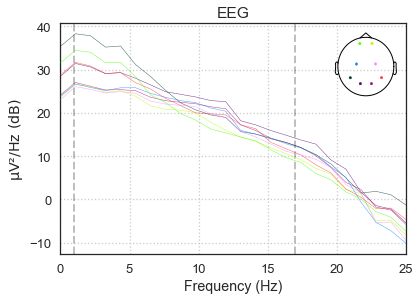

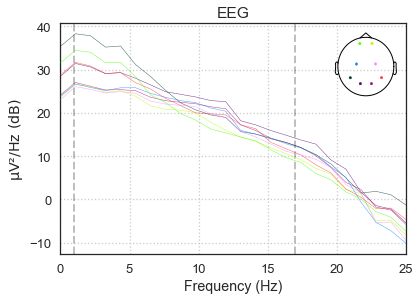

In [42]:
epochs['Target'].plot_psd(picks='eeg')

    Using multitaper spectrum estimation with 7 DPSS windows


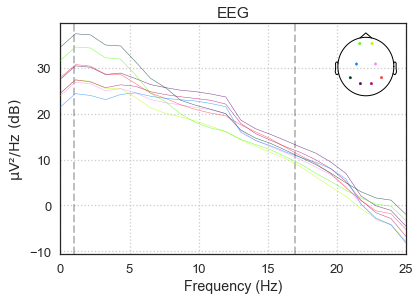

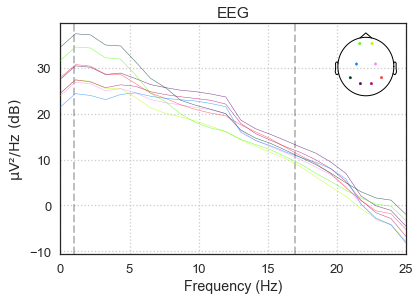

In [43]:
epochs['NoTarget'].plot_psd(picks='eeg')

## Más info

In [44]:
print('Épocas x canales x tiempo')
print(epochs.get_data().shape)


Épocas x canales x tiempo
(97, 8, 46)


## Downsampling via Epochs

Realizado con el rawdata -> básicamente es lo mismo que hacerlo con el Epoch (epoch es igual que raw pero lleva datos de eventos)

Epochs objects are a data structure for representing and analyzing equal-duration chunks of the EEG/MEG signal. Epochs are most often used to represent data that is time-locked to repeated experimental events (such as stimulus onsets or subject button presses), but can also be used for storing sequential or overlapping frames of a continuous signal (e.g., for analysis of resting-state activity; see Making equally-spaced Events arrays). Inside an Epochs object, the data are stored in an array of shape (n_epochs, n_channels, n_times).

Epochs objects have many similarities with Raw objects, including:

- They can be loaded from and saved to disk in .fif format, and their data can be exported to a NumPy array through the get_data() method or to a Pandas DataFrame through the to_data_frame() method.

- Both Epochs and Raw objects support channel selection by index or name, including pick(), pick_channels() and pick_types() methods.

- SSP projector manipulation is possible through add_proj(), del_proj(), and plot_projs_topomap() methods.

- Both Epochs and Raw objects have copy(), crop(), time_as_index(), filter(), and resample() methods.

- Both Epochs and Raw objects have times, ch_names, proj, and info attributes.

- Both Epochs and Raw objects have built-in plotting methods plot(), plot_psd(), and plot_psd_topomap().

In [45]:
# print('Original sampling rate:', epochs.info['sfreq'], 'Hz')
# # epochs_resampled = epochs.copy().resample(64, npad='auto')
# epochs_resampled = epochs.copy().resample(50, npad='auto')
# print('New sampling rate:', epochs_resampled.info['sfreq'], 'Hz')

# # Plot a piece of data to see the effects of downsampling
# plt.figure(figsize=(7, 3))

# n_samples_to_plot = int(0.5 * epochs.info['sfreq'])  # plot 0.5 seconds of data
# plt.plot(epochs.times[:n_samples_to_plot],
#          epochs.get_data()[0, 0, :n_samples_to_plot], color='black')

# n_samples_to_plot = int(0.5 * epochs_resampled.info['sfreq'])
# plt.plot(epochs_resampled.times[:n_samples_to_plot],
#          epochs_resampled.get_data()[0, 0, :n_samples_to_plot],
#          '-o', color='red')

# plt.xlabel('time (s)')
# plt.legend(['original', 'downsampled'], loc='best')
# plt.title('Effect of downsampling')

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


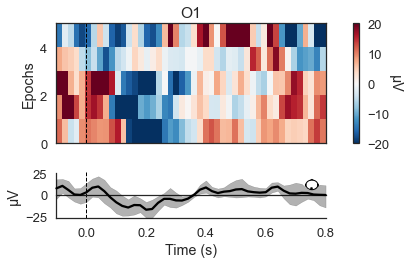

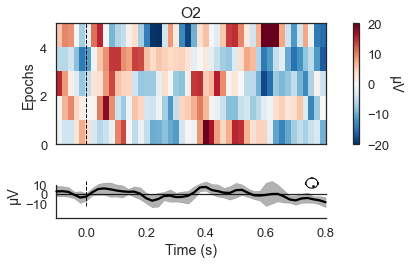

5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
combining channels using "gfp"


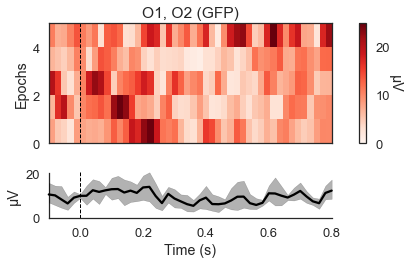

[<Figure size 432x288 with 3 Axes>]

In [46]:
epochs['Target'].plot_image(picks=['O1', 'O2'], vmin=-20, vmax=20)
epochs['Target'].plot_image(picks=['O1', 'O2'], combine='gfp')


## Comparar épocas

https://mne.tools/stable/auto_tutorials/intro/plot_10_overview.html#sphx-glr-auto-tutorials-intro-plot-10-overview-py
muy interesante el hecho de cuando se tenga épocas distintas, compararlas con plot_compare_evokeds

- Media de los targets (supuesto p300, momentos exactos donde mostramos la imagen)

combining channels using "gfp"


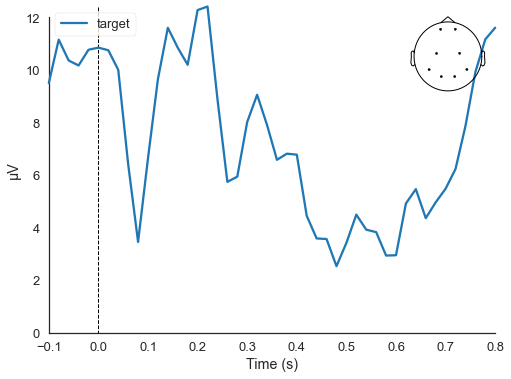

[<Figure size 576x432 with 2 Axes>]

In [47]:
mne.viz.plot_compare_evokeds(dict(target=epochs['Target'].average()),
                             legend='upper left', show_sensors='upper right')

## ACLARACIÓN

#### La gráfica anterior no muestra un P300 claro pero sí que podemos intuir que hay una bajada de unos 6µV y luego un aumento de unos 6µV en el transcurro de 0.2s y dentro del marco de tiempo seleccionado para un posible P300

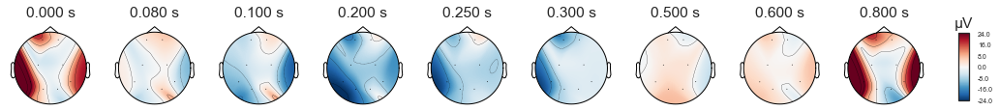

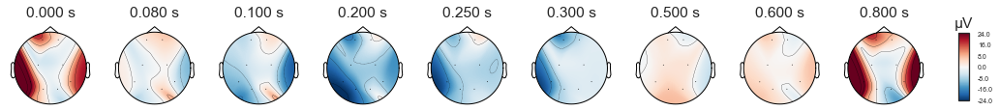

In [48]:
epochs['Target'].average().plot_topomap(times=[0., 0.08, 0.1, 0.2, 0.25, 0.3, 0.5, 0.6, 0.8], ch_type='eeg')

## Representación de eventos con 3 subfiguras

In [49]:
# fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# mne.viz.plot_events(events, event_id=event_id, sfreq=raw.info['sfreq'], first_samp=raw.first_samp, axes=axs[0], show=False)
# axs[0].set(title="restricted to event 1")

# mne.viz.plot_events(events, axes=axs[1], show=False)
# axs[1].set(title="restricted to event 1 or 2")

# mne.viz.plot_events(events, axes=axs[2], show=False)
# axs[2].set(title="keep all but 4 and 32")
# plt.setp([ax.get_xticklabels() for ax in axs], rotation=45)
# plt.tight_layout()
# plt.show()

## Representación de actividad cerebrar

times: 10 instantes aleatorios entre 0.05 segundos y 0.8 segundos

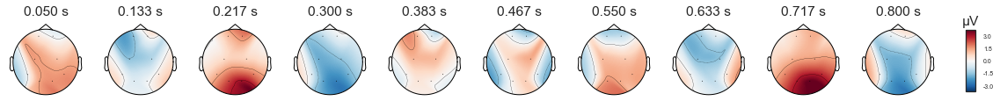

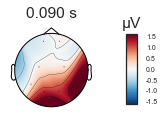

Text(0.5, 0.05, 'average from 40-140 ms')

In [50]:
times = np.linspace(0.05, 0.8, 10)
epochs.average().plot_topomap(ch_type='eeg', times=times, colorbar=True)

fig = epochs.average().plot_topomap(ch_type='eeg', times=0.09, average=0.1)
fig.text(0.5, 0.05, 'average from 40-140 ms', ha='center')

## Image plot

Interesante para ver en qué momento hay un pico alto de voltage y en qué canal exacto se está produciendo

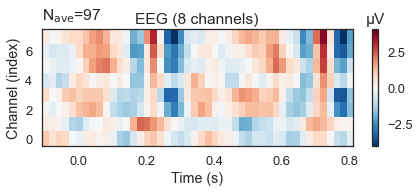

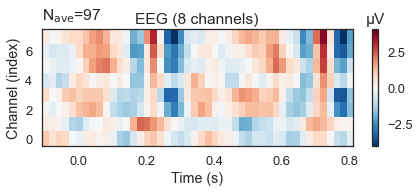

In [51]:
epochs.average().plot_image(picks='eeg')

## Clasificación

In [52]:
from sklearn.pipeline import make_pipeline

from mne.decoding import Vectorizer

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit, StratifiedKFold

from pyriemann.estimation import ERPCovariances
from pyriemann.tangentspace import TangentSpace
from pyriemann.classification import MDM
from pyriemann.spatialfilters import Xdawn
import pandas as pd
import seaborn as sns
from datetime import datetime as dt


from collections import OrderedDict

def ejecutar_clasificador(epochs):
    clfs = OrderedDict()

    clfs['Vect + LR'] = make_pipeline(Vectorizer(), StandardScaler(), LogisticRegression())
    clfs['Vect + RegLDA'] = make_pipeline(Vectorizer(), LDA(shrinkage='auto', solver='eigen'))
    clfs['Xdawn + RegLDA'] = make_pipeline(Xdawn(2, classes=[1]), Vectorizer(), LDA(shrinkage='auto', solver='eigen'))
    clfs['ERPCov + TS'] = make_pipeline(ERPCovariances(), TangentSpace(), LogisticRegression())
    clfs['ERPCov + MDM'] = make_pipeline(ERPCovariances(), MDM())

    print("Comienzo del proceso de clasificación del experimento: ", dt.now().strftime('%d-%m-%Y, %H:%M:%S (GMT+1)'))


    # format data
    epochs.pick_types(eeg=True)
    X = epochs.get_data() * 1e6
    times = epochs.times
    y = epochs.events[:, -1]

    # define cross validation
    cv = StratifiedShuffleSplit(n_splits=10, test_size=0.25, random_state=42)

    # run cross validation for each pipeline
    auc = []
    methods = []
    for m in clfs:
        res = cross_val_score(clfs[m], X, y==1, scoring='roc_auc', cv=cv, n_jobs=-1)
        auc.extend(res)
        methods.extend([m]*len(res))
        print("[{}] Puntuación = {}/1".format(m, np.mean(res)))

    print("Fin del proceso de clasificación del experimento: ", dt.now().strftime('%d-%m-%Y, %H:%M:%S (GMT+1)'))
    results = pd.DataFrame(data=auc, columns=['Área bajo curva (AUC)'])
    results['Método de clasificación'] = methods

    plt.figure(figsize=[8,4])
    sns.barplot(data=results, x='Área bajo curva (AUC)', y='Método de clasificación', ci=None)
    plt.xlim(0, 1)
    sns.despine()



Comienzo del proceso de clasificación del experimento:  30-07-2020, 13:59:22 (GMT+1)
[Vect + LR] Puntuación = 0.8208333333333334/1
[Vect + RegLDA] Puntuación = 0.7208333333333334/1
[Xdawn + RegLDA] Puntuación = 0.6166666666666667/1
[ERPCov + TS] Puntuación = 0.7458333333333333/1
[ERPCov + MDM] Puntuación = 0.8166666666666667/1
Fin del proceso de clasificación del experimento:  30-07-2020, 13:59:29 (GMT+1)


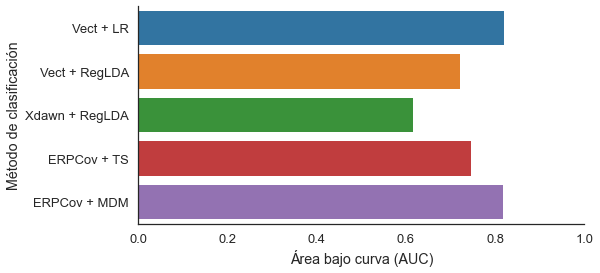

In [53]:
ejecutar_clasificador(epochs)

## \***** TESTING \*****

In [54]:
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report

# Labels de la clase Epochs
labels = epochs.events[:, -1]

# Instancia validador cruzado
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Instancia clasificador
clf = make_pipeline(Vectorizer(), StandardScaler(), LogisticRegression(solver='liblinear', C=1, class_weight="balanced"))
#clf = SVC(kernel='linear', C=1, class_weight = "balanced")

# Proceso de validación cruzada
preds = np.empty(len(labels))
for train, test in cv.split(epochs, labels):
#     print("TRAIN")
#     print(train)
#     print("TRAIN DATA")
#     print(epochs[train].get_data())
#     print("TEST")
#     print(test)
#     print("TEST DATA")
#     print(epochs[test].get_data())
#     print("--------------------------------------------------------")
    clf.fit(epochs[train].get_data(), labels[train]) # ajustar
    preds[test] = clf.predict(epochs[test].get_data()) # 

# Info del proceso
target_names = ['Target', 'NoTarget']
report = classification_report(labels, preds, target_names=target_names)
print(report)

              precision    recall  f1-score   support

      Target       0.00      0.00      0.00         5
    NoTarget       0.94      0.91      0.93        92

    accuracy                           0.87        97
   macro avg       0.47      0.46      0.46        97
weighted avg       0.90      0.87      0.88        97



c:\users\asus\desktop\tfg\bci\proyecto-enriquetfg\venv\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)


## Añadimos ruido al raw filtrado para ver si ya no podemos determinar el P300

<Covariance  |  diagonal : 8, n_samples : 0, data : [4.e-14 4.e-14 4.e-14 4.e-14 4.e-14 4.e-14 4.e-14 4.e-14]>
3.9999999999999994e-14
<Covariance  |  diagonal : 8, n_samples : 0, data : [2.52382938e-10 2.52382938e-10 2.52382938e-10 2.52382938e-10
 2.52382938e-10 2.52382938e-10 2.52382938e-10 2.52382938e-10]>
Fragmento de la señal SIN ruido (mismas gráficas que las mostradas anteriormente) | Noise por canal: 3.9999999999999994e-14


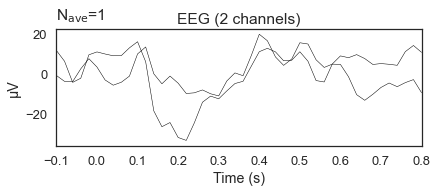

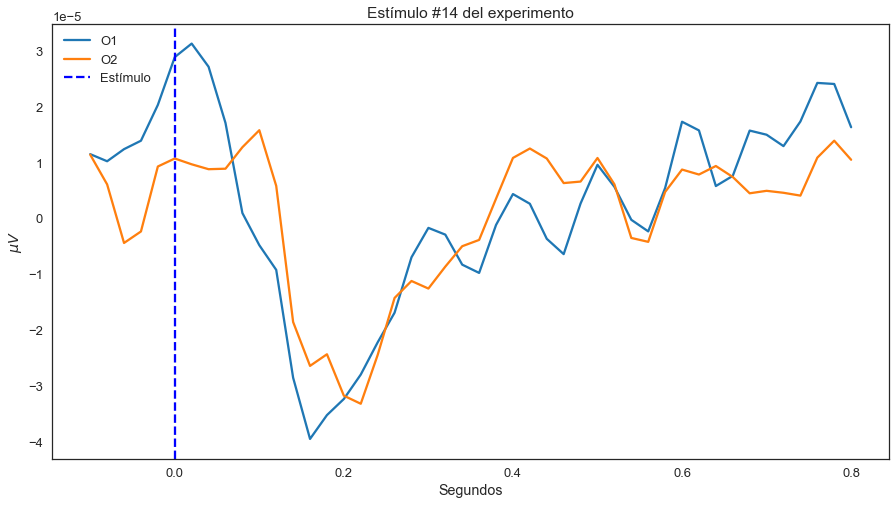

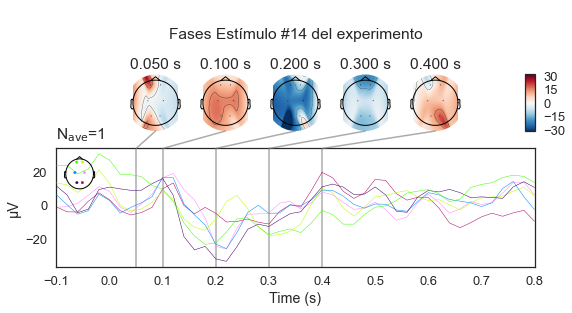

Fragmento de la señal CON ruido | Noise Order = 3.8 | Noise por canal: 2.523829377920772e-10 |


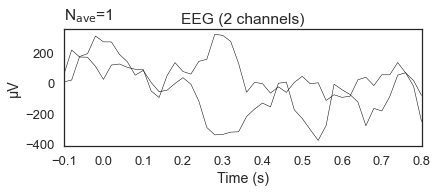

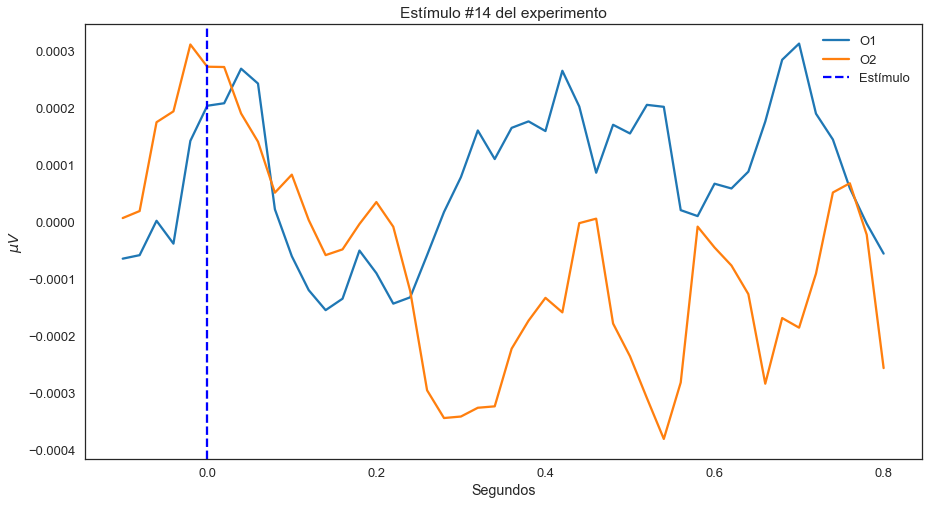

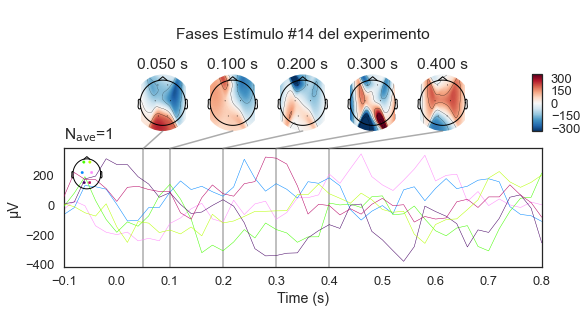

Comienzo del proceso de clasificación del experimento:  30-07-2020, 13:59:32 (GMT+1)
[Vect + LR] Puntuación = 0.24166666666666664/1
[Vect + RegLDA] Puntuación = 0.26249999999999996/1
[Xdawn + RegLDA] Puntuación = 0.25833333333333336/1
[ERPCov + TS] Puntuación = 0.2833333333333333/1
[ERPCov + MDM] Puntuación = 0.31249999999999994/1
Fin del proceso de clasificación del experimento:  30-07-2020, 13:59:33 (GMT+1)


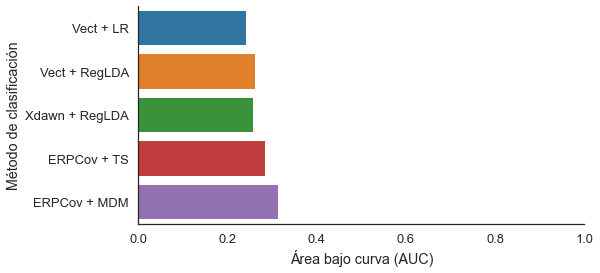

In [55]:
import warnings
warnings.filterwarnings('ignore')

epochs_noise = epochs.copy()
cov = mne.make_ad_hoc_cov(epochs_noise.info)
rng = np.random.RandomState(0)

print(cov)

# cov['data'] tiene el ruido de cada canal
# podemos añadir ruido a todos los canales con fill
order_noise = 3.8
one_channel = cov['data'][0] # igual para todos por defecto, cogemos el primero
print(one_channel)
cov['data'].fill(one_channel * pow(10, order_noise))
one_channel_new = cov['data'][0]

print(cov)

epochs_noise_apply = mne.simulation.add_noise(epochs_noise, cov, iir_filter=[0.2, -0.2, 0.04], random_state=rng, verbose='ERROR')



# ax1.plot(times_ini, data_ini.T);
# ax1.set_title('Raw data original')
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')

# ax2.plot(times_f, data_f.T);
# ax2.set_title('Raw data filtrado')
# ax2.set_xlabel('Segundos')

# plt.legend(raw.ch_names[:8], loc=1);
# plt.tight_layout()

data_example = {}

print("Fragmento de la señal SIN ruido (mismas gráficas que las mostradas anteriormente) | Noise por canal: {}".format(one_channel))
for ii, ev in enumerate(epochs.iter_evoked(True)):
    if ev.comment == '1':
        if ii == 14:
#             plot_all_evoked()
            plot_occipital_evoked()

            
            data_example['0'] = [ev.times, ev.data[-3:-1].T]
    
            #fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
            #ev.plot(picks='eeg', spatial_colors=True)

print("Fragmento de la señal CON ruido | Noise Order = {} | Noise por canal: {} |".format(order_noise, one_channel_new))
for ii, ev in enumerate(epochs_noise_apply.iter_evoked(True)):
    if ev.comment == '1':
        if ii == 14:
#             plot_all_evoked()
            plot_occipital_evoked()
            
            data_example['1'] = [ev.times, ev.data[-3:-1].T]
            #fig = ev.plot_topomap(times=np.linspace(0.00, 0.1, 10), ch_type='eeg', colorbar=True)
            #ev.plot(picks='eeg', spatial_colors=True)

ejecutar_clasificador(epochs_noise_apply)
# print(data_example)
# fig, (ax1, ax2) = plt.subplots(1,2, figsize = (40, 10))

# ax1.plot(data_example['0'][0], data_example['0'][1])
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')
# ax1.set_title('abc')

# ax1.plot(data_example['1'][0], data_example['1'][0])
# ax1.set_xlabel('Segundos')
# ax1.set_ylabel('$\mu V$')
# ax1.set_title('def')      
# plt.legend(raw.ch_names[-3:-1], loc=1);            


In [56]:
epochs.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, C3, C4, P7, P8, O1, O2
 chs: 8 EEG
 custom_ref_applied: False
 dig: 11 items (3 Cardinal, 8 EEG)
 highpass: 1.0 Hz
 lowpass: 17.0 Hz
 meas_date: unspecified
 nchan: 8
 projs: []
 sfreq: 50.0 Hz
>

## Obtenemos CSV correspondiente a la clase Epochs

#### Este CSV tendrá:
- Señal EEG filtrada con todos los canales
- Cada una de las épocas
- Etiqueta Target/NoTarget correspondiente a cada sample

#### Será de utilidad para hacer análisis externos o someter la señal EEG a clasificadores basados en Machine Learning externos

In [57]:
index = ['epoch', 'time']
scale = dict(eeg=1e6)

df = epochs.to_data_frame(picks="eeg", scalings=scale, time_format="ms", index=index)
df_reorder = df[['Fp1', 'Fp2', 'C3', 'C4', 'P7', 'P8', 'O1', 'O2', 'condition']] # rearrange column here
df_reorder.to_csv("epochs_dump.csv", sep=";")

In [58]:
raw_notch_and_filter_downsamp.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, C3, C4, P7, P8, O1, O2, Stim
 chs: 8 EEG, 1 STIM
 custom_ref_applied: False
 dig: 11 items (3 Cardinal, 8 EEG)
 highpass: 1.0 Hz
 lowpass: 17.0 Hz
 meas_date: unspecified
 nchan: 9
 projs: []
 sfreq: 50.0 Hz
>